Notebook used for training the model ACVAE for voice conversion. \

Dataset: the data used is available at https://datashare.is.ed.ac.uk/handle/10283/2211
The data (raw wav files of the four speakers "SF1", "SF2", "SM1", "SM2" were downloaded and placed in repository data/vcc2016_training/" in their own subfolders.



In [ ]:
try:
  import google.colab
  IN_COLAB = True
except:
  IN_COLAB = False

## Drive and git

In [ ]:
if IN_COLAB:
    from google.colab import drive
    drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [ ]:
if IN_COLAB:
    !git clone https://github.com/torresbf/acvae-vc

Cloning into 'acvae-vc'...
remote: Enumerating objects: 2887, done.
remote: Counting objects: 100% (2887/2887), done.
remote: Compressing objects: 100% (2863/2863), done.
remote: Total 2887 (delta 35), reused 2869 (delta 20), pack-reused 0
Receiving objects: 100% (2887/2887), 287.62 MiB | 25.57 MiB/s, done.
Resolving deltas: 100% (35/35), done.
Checking out files: 100% (2757/2757), done.


In [ ]:
if IN_COLAB:
    %cd "/content/acvae-vc/"
    !git pull

/content/acvae-vc
Already up to date.


## Imports

In [ ]:
if IN_COLAB:
    !pip install pyworld pysptk

     |████████████████████████████████| 212 kB 27.3 MB/s 
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
    Preparing wheel metadata ... done
     |████████████████████████████████| 410 kB 63.9 MB/s 
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
    Preparing wheel metadata ... done
  Created wheel for pyworld: filename=pyworld-0.3.0-cp37-cp37m-linux_x86_64.whl size=609492 sha256=b820dece06b52bec59d23f90ced08c45ab144aa4e6e51663024591dbc5440783
  Stored in directory: /root/.cache/pip/wheels/e7/7c/11/c775fffa0e1e7b05a6604b4323408a77f80fb4ab304d96b5c6
  Created wheel for pysptk: filename=pysptk-0.1.20-cp37-cp37m-linux_x86_64.whl size=929971 sha256=669f541a77a57885b8e5226e79171402ef951cb3a700a6ba56572ed3ad7b9d41
  Stored in directory: /root/.cache/pip/wheels/dd/37/3f/7583b00bf73e73650aad5d268ee46b95dbd6dffbd237e1bf58
Successfully built pyworld pysptk


In [ ]:
%load_ext autoreload
%autoreload 2

import numpy as np
import torch
import torch.nn as nn
import torchvision.datasets as dsets
import torchvision.transforms as transforms
from torch.autograd import Variable

import os
#import pyworld
import librosa
import time
import matplotlib.pyplot as plt

from preprocess import *
from model import ACVAE
from data import data_load, data_load_preprocessed
from utils import *
import soundfile as sf

torch.manual_seed(0)
np.random.seed(0)

## Data preprocessing

Extracting features and storing them as npy files

In [ ]:
do_preprocessing = False
if do_preprocessing:
  for voice_label in voice_dir_list:
    voice_path = os.path.join(data_dir, voice_label)
    files = os.listdir(voice_path)
    vects = []
    for wav_file in files:
      if wav_file.endswith('.wav'):
        wav, _ = librosa.load(os.path.join(voice_path, wav_file), sr = sampling_rate, mono = True)
        wav = librosa.util.normalize(wav, norm=np.inf, axis=None)
        wav = wav_padding(wav = wav, sr = sampling_rate, frame_period = frame_period, multiple = 4)
        f0, timeaxis, sp, ap, mc = world_decompose(wav = wav, fs = sampling_rate, frame_period = frame_period, num_mcep = num_mcep)
        
        mc_transposed  = np.array(mc).T
        
        frames = np.shape(mc_transposed)[1]

        cur_dir = os.path.join(data_npy_dir, voice_label)
        np.save(os.path.join(cur_dir, wav_file[:-4]), mc_transposed, allow_pickle=True)
        print(os.path.join(cur_dir, wav_file[:-4]))

## Data settings

In [ ]:
data_dir = "./data/vcc2016_training/"
voice_dir_list = ["SF1", "SF2", "SM1", "SM2"]
data_npy_dir = "./data/vcc2016_npy/"

## Training Settings

In [ ]:
num_epochs = 10000
batch_size = 8
learning_rate =1e-3
learning_rate_ = 1e-4
learning_rate__ = 1e-5
learning_rate___ = 1e-6
sampling_rate = 16000
num_envelope  = 36
num_mcep = 36
frame_period = 5.0
n_frames = 512

## Model Settings

In [ ]:
lambda_p = 60  ## changed
lambda_s = 60
nb_label = len(voice_dir_list)  # Number of labels if the number of different speakers

In [ ]:
model_name = 'model_2016_' + str(lambda_p) +'_' + str(lambda_s) +'_' + '-'.join(voice_dir_list) 
model_name = model_name + f'_{n_frames}'
print(model_name)

model_2016_60_60_SF1-SF2-SM1-SM2_512


In [ ]:
#model_name = "model_lambda70_f1f2m1m2"
model_dir = "./model/" + model_name
output_dir = "./converted_voices/test/" + model_name + "_training_progress"
figure_dir = "./figure/" + model_name
final_save_loss_dir = model_dir

In [ ]:
def test_conv(model, epoch):
    print("Test")
    
    if not os.path.exists(output_dir):
        os.makedirs(output_dir)
    
    output_epoch_dir = os.path.join(output_dir, "epoch_{:05}".format(epoch))
    if not os.path.exists(output_epoch_dir):
        os.makedirs(output_epoch_dir)
    
    for s_label in range(nb_label):
    
        voice_path_s = os.path.join(data_dir, voice_dir_list[s_label])

        files = os.listdir(voice_path_s)
        file = ""
        while file.count("wav") == 0:
            file = np.random.choice(files)
        
        print("Source File:" + file)

        for t_label in range(nb_label):

            if (t_label == s_label):
                continue

            voice_path_t = os.path.join(data_dir, voice_dir_list[t_label])

            wav, _ = librosa.load(os.path.join(voice_path_s, file), sr = sampling_rate, mono = True)
            wav = librosa.util.normalize(wav, norm=np.inf, axis=None)
            wav = wav_padding(wav = wav, sr = sampling_rate, frame_period = frame_period, multiple = 4)
            f0, timeaxis, sp, ap, mc = world_decompose(wav = wav, fs = sampling_rate, frame_period = frame_period)

            mc_transposed  = np.array(mc).T

            norm_coefs_path_s = os.path.join(voice_path_s, "mcep_"+voice_dir_list[s_label]+".npz")
            norm_coefs_path_t = os.path.join(voice_path_t, "mcep_"+voice_dir_list[t_label]+".npz")
            mc_norm = normalize_mccs(mc_transposed, norm_coefs_path_s)

            x = torch.Tensor(mc_norm).view(1, 1, mc_norm.shape[0], mc_norm.shape[1])

            label_s_tensor = torch.Tensor(np.array([s_label])).view(1, 1)
            label_t_tensor = torch.Tensor(np.array([t_label])).view(1, 1)

            x = x.to(device)
            label_s_tensor = label_s_tensor.to(device)
            label_t_tensor = label_t_tensor.to(device)

            # Extracts latent state and uses it to reconstruct target
            mu_enc, logvar_enc = model.encode(x, label_s_tensor)
            z_enc = model.reparameterize(mu_enc, logvar_enc)
            # x^
            mu_dec_t, logvar_dec_t = model.decode(z_enc, label_t_tensor)
            z_dec_t = model.reparameterize(mu_dec_t, logvar_dec_t)
            
            if (torch.cuda.is_available()):
                z_dec_t = z_dec_t.data.cpu().numpy().reshape((mc_norm.shape[0], mc_norm.shape[1]))
            else:
                z_dec_t = z_dec_t.data.numpy().reshape((mc_norm.shape[0], mc_norm.shape[1]))
            # x_
            # Using same latent state use it to reconstruct source
            mu_dec_s, logvar_dec_s = model.decode(z_enc, label_s_tensor)
            z_dec_s = model.reparameterize(mu_dec_s, logvar_dec_s)

            if (torch.cuda.is_available()):
                z_dec_s = z_dec_s.data.cpu().numpy().reshape((mc_norm.shape[0], mc_norm.shape[1]))
            else:
                z_dec_s = z_dec_s.data.numpy().reshape((mc_norm.shape[0], mc_norm.shape[1]))

            #mc_converted_t = z_dec_t * mcep_std_t + mcep_mean_t
            mc_converted_t = unnormalize_mccs(z_dec_t, norm_coefs_path_t)
            mc_converted_t = mc_converted_t.T
            mc_converted_t = np.ascontiguousarray(mc_converted_t)
            sp_converted_t = world_decode_mc(mc = mc_converted_t, fs = sampling_rate)
            #mc_converted_s = z_dec_s * mcep_std_s + 
            mc_converted_s = unnormalize_mccs(z_dec_s, norm_coefs_path_s)
            mc_converted_s = mc_converted_s.T
            mc_converted_s = np.ascontiguousarray(mc_converted_s)
            sp_converted_s = world_decode_mc(mc = mc_converted_s, fs = sampling_rate)

            sp_gained = np.multiply(sp, np.divide(sp_converted_t, sp_converted_s))

            logf0s_normalization_params_s = np.load(os.path.join(voice_path_s, "log_f0_"+voice_dir_list[s_label]+".npz"))
            logf0s_mean_s = logf0s_normalization_params_s['mean']
            logf0s_std_s = logf0s_normalization_params_s['std']
            logf0s_normalization_params_t = np.load(os.path.join(voice_path_t, "log_f0_"+voice_dir_list[t_label]+".npz"))
            logf0s_mean_t = logf0s_normalization_params_t['mean']
            logf0s_std_t = logf0s_normalization_params_t['std']


            f0_converted = pitch_conversion(f0 = f0, mean_log_src = logf0s_mean_s, std_log_src = logf0s_std_s, mean_log_target = logf0s_mean_t, std_log_target = logf0s_std_t)
            
            wav_transformed = world_speech_synthesis(f0 = f0_converted, sp = sp_gained, ap = ap, fs = sampling_rate, frame_period = frame_period)
            #librosa.output.write_wav(os.path.join(output_epoch_dir, voice_dir_list[s_label]+"_to_"+voice_dir_list[t_label]+"_["+file+"].wav"), 
                                    # wav_transformed, sampling_rate)
            sf.write(os.path.join(output_epoch_dir, voice_dir_list[s_label]+"_to_"+voice_dir_list[t_label]+"_["+file+"].wav"),
                     wav_transformed, 
                     sampling_rate)
            wav_source = world_speech_synthesis(f0 = f0_converted, sp = sp, ap = ap, fs = sampling_rate, frame_period = frame_period)
            #librosa.output.write_wav(os.path.join(output_epoch_dir, voice_dir_list[s_label]+"_to_"+voice_dir_list[t_label]+"_["+file+"]_nonconv.wav"), wav_source, sampling_rate)
            sf.write(os.path.join(output_epoch_dir, voice_dir_list[s_label]+"_to_"+voice_dir_list[t_label]+"_["+file+"]_nonconv.wav"),
                     wav_source, 
                     sampling_rate)
            print("Converted: " + voice_dir_list[s_label] + " -> " + voice_dir_list[t_label])


## Training

In [ ]:
a = data_load_preprocessed(batch_size, 
                            s = -1, 
                            t = -1, 
                            nb_label=4, 
                            data_dir=data_dir, 
                            data_npy_dir=data_npy_dir,
                            voice_dir_list=voice_dir_list, 
                            n_frames=n_frames,
                            sampling_rate=sampling_rate,
                            frame_period=frame_period,
                            num_mcep=num_mcep)
b = data_load(batch_size, 
                            s = -1, 
                            t = -1, 
                            nb_label=4, 
                            data_dir=data_dir, 
                            voice_dir_list=voice_dir_list, 
                            n_frames=n_frames,
                            sampling_rate=sampling_rate,
                            frame_period=frame_period,
                            num_mcep=num_mcep)
print(a[0].shape)

print(b[0].shape)

torch.Size([8, 1, 36, 512])
torch.Size([8, 1, 36, 512])


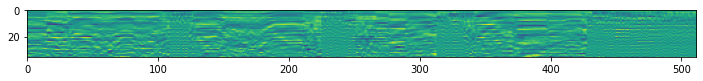

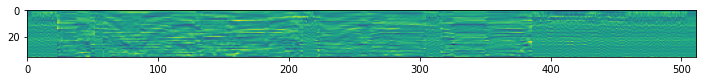

In [ ]:
plt.figure(figsize=(12,12))
plt.imshow(a[0][0][0])
plt.figure(figsize=(12,12))
plt.imshow(b[0][0][0])

cuda
Epoch: 1
Time Elapsed for one epoch: 00:00:00
Epoch: 2
Time Elapsed for one epoch: 00:00:00
Epoch: 3
Time Elapsed for one epoch: 00:00:00
Epoch: 4
Time Elapsed for one epoch: 00:00:00
Epoch: 5
Time Elapsed for one epoch: 00:00:00
Epoch: 6
Time Elapsed for one epoch: 00:00:00
Epoch: 7
Time Elapsed for one epoch: 00:00:00
Epoch: 8
Time Elapsed for one epoch: 00:00:00
Epoch: 9
Time Elapsed for one epoch: 00:00:00
Epoch: 10
Time Elapsed for one epoch: 00:00:00
Epoch: 11
Time Elapsed for one epoch: 00:00:00
Epoch: 12
Time Elapsed for one epoch: 00:00:00
Epoch: 13
Time Elapsed for one epoch: 00:00:00
Epoch: 14
Time Elapsed for one epoch: 00:00:00
Epoch: 15
Time Elapsed for one epoch: 00:00:00
Epoch: 16
Time Elapsed for one epoch: 00:00:00
Epoch: 17
Time Elapsed for one epoch: 00:00:00
Epoch: 18
Time Elapsed for one epoch: 00:00:00
Epoch: 19
Time Elapsed for one epoch: 00:00:00
Epoch: 20
Time Elapsed for one epoch: 00:00:00
Epoch: 21
Time Elapsed for one epoch: 00:00:00
Epoch: 22
Time El

/content/acvae-vc/utils.py:51: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:60: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:73: RuntimeWarning: More tha

Time Elapsed for one epoch: 00:00:00
Epoch: 501
Time Elapsed for one epoch: 00:00:00
Epoch: 502
Time Elapsed for one epoch: 00:00:00
Epoch: 503
Time Elapsed for one epoch: 00:00:00
Epoch: 504
Time Elapsed for one epoch: 00:00:00
Epoch: 505
Time Elapsed for one epoch: 00:00:00
Epoch: 506
Time Elapsed for one epoch: 00:00:00
Epoch: 507
Time Elapsed for one epoch: 00:00:00
Epoch: 508
Time Elapsed for one epoch: 00:00:00
Epoch: 509
Time Elapsed for one epoch: 00:00:00
Epoch: 510
Time Elapsed for one epoch: 00:00:00
Epoch: 511
Time Elapsed for one epoch: 00:00:00
Epoch: 512
Time Elapsed for one epoch: 00:00:00
Epoch: 513
Time Elapsed for one epoch: 00:00:00
Epoch: 514
Time Elapsed for one epoch: 00:00:00
Epoch: 515
Time Elapsed for one epoch: 00:00:00
Epoch: 516
Time Elapsed for one epoch: 00:00:00
Epoch: 517
Time Elapsed for one epoch: 00:00:00
Epoch: 518
Time Elapsed for one epoch: 00:00:00
Epoch: 519
Time Elapsed for one epoch: 00:00:00
Epoch: 520
Time Elapsed for one epoch: 00:00:00
Epo

/content/acvae-vc/utils.py:51: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:60: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:73: RuntimeWarning: More tha

Time Elapsed for one epoch: 00:00:00
Epoch: 601
Time Elapsed for one epoch: 00:00:00
Epoch: 602
Time Elapsed for one epoch: 00:00:00
Epoch: 603
Time Elapsed for one epoch: 00:00:00
Epoch: 604
Time Elapsed for one epoch: 00:00:00
Epoch: 605
Time Elapsed for one epoch: 00:00:00
Epoch: 606
Time Elapsed for one epoch: 00:00:00
Epoch: 607
Time Elapsed for one epoch: 00:00:00
Epoch: 608
Time Elapsed for one epoch: 00:00:00
Epoch: 609
Time Elapsed for one epoch: 00:00:00
Epoch: 610
Time Elapsed for one epoch: 00:00:00
Epoch: 611
Time Elapsed for one epoch: 00:00:00
Epoch: 612
Time Elapsed for one epoch: 00:00:00
Epoch: 613
Time Elapsed for one epoch: 00:00:00
Epoch: 614
Time Elapsed for one epoch: 00:00:00
Epoch: 615
Time Elapsed for one epoch: 00:00:00
Epoch: 616
Time Elapsed for one epoch: 00:00:00
Epoch: 617
Time Elapsed for one epoch: 00:00:00
Epoch: 618
Time Elapsed for one epoch: 00:00:00
Epoch: 619
Time Elapsed for one epoch: 00:00:00
Epoch: 620
Time Elapsed for one epoch: 00:00:00
Epo

/content/acvae-vc/utils.py:51: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:60: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:73: RuntimeWarning: More tha

Time Elapsed for one epoch: 00:00:00
Epoch: 701
Time Elapsed for one epoch: 00:00:00
Epoch: 702
Time Elapsed for one epoch: 00:00:00
Epoch: 703
Time Elapsed for one epoch: 00:00:00
Epoch: 704
Time Elapsed for one epoch: 00:00:00
Epoch: 705
Time Elapsed for one epoch: 00:00:00
Epoch: 706
Time Elapsed for one epoch: 00:00:00
Epoch: 707
Time Elapsed for one epoch: 00:00:00
Epoch: 708
Time Elapsed for one epoch: 00:00:00
Epoch: 709
Time Elapsed for one epoch: 00:00:00
Epoch: 710
Time Elapsed for one epoch: 00:00:00
Epoch: 711
Time Elapsed for one epoch: 00:00:00
Epoch: 712
Time Elapsed for one epoch: 00:00:00
Epoch: 713
Time Elapsed for one epoch: 00:00:00
Epoch: 714
Time Elapsed for one epoch: 00:00:00
Epoch: 715
Time Elapsed for one epoch: 00:00:00
Epoch: 716
Time Elapsed for one epoch: 00:00:00
Epoch: 717
Time Elapsed for one epoch: 00:00:00
Epoch: 718
Time Elapsed for one epoch: 00:00:00
Epoch: 719
Time Elapsed for one epoch: 00:00:00
Epoch: 720
Time Elapsed for one epoch: 00:00:00
Epo

/content/acvae-vc/utils.py:51: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:60: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:73: RuntimeWarning: More tha

Time Elapsed for one epoch: 00:00:00
Epoch: 801
Time Elapsed for one epoch: 00:00:00
Epoch: 802
Time Elapsed for one epoch: 00:00:00
Epoch: 803
Time Elapsed for one epoch: 00:00:00
Epoch: 804
Time Elapsed for one epoch: 00:00:00
Epoch: 805
Time Elapsed for one epoch: 00:00:00
Epoch: 806
Time Elapsed for one epoch: 00:00:00
Epoch: 807
Time Elapsed for one epoch: 00:00:00
Epoch: 808
Time Elapsed for one epoch: 00:00:00
Epoch: 809
Time Elapsed for one epoch: 00:00:00
Epoch: 810
Time Elapsed for one epoch: 00:00:00
Epoch: 811
Time Elapsed for one epoch: 00:00:00
Epoch: 812
Time Elapsed for one epoch: 00:00:00
Epoch: 813
Time Elapsed for one epoch: 00:00:00
Epoch: 814
Time Elapsed for one epoch: 00:00:00
Epoch: 815
Time Elapsed for one epoch: 00:00:00
Epoch: 816
Time Elapsed for one epoch: 00:00:00
Epoch: 817
Time Elapsed for one epoch: 00:00:00
Epoch: 818
Time Elapsed for one epoch: 00:00:00
Epoch: 819
Time Elapsed for one epoch: 00:00:00
Epoch: 820
Time Elapsed for one epoch: 00:00:00
Epo

/content/acvae-vc/utils.py:51: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:60: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:73: RuntimeWarning: More tha

Time Elapsed for one epoch: 00:00:00
Epoch: 901
Time Elapsed for one epoch: 00:00:00
Epoch: 902
Time Elapsed for one epoch: 00:00:00
Epoch: 903
Time Elapsed for one epoch: 00:00:00
Epoch: 904
Time Elapsed for one epoch: 00:00:00
Epoch: 905
Time Elapsed for one epoch: 00:00:00
Epoch: 906
Time Elapsed for one epoch: 00:00:00
Epoch: 907
Time Elapsed for one epoch: 00:00:00
Epoch: 908
Time Elapsed for one epoch: 00:00:00
Epoch: 909
Time Elapsed for one epoch: 00:00:00
Epoch: 910
Time Elapsed for one epoch: 00:00:00
Epoch: 911
Time Elapsed for one epoch: 00:00:00
Epoch: 912
Time Elapsed for one epoch: 00:00:00
Epoch: 913
Time Elapsed for one epoch: 00:00:00
Epoch: 914
Time Elapsed for one epoch: 00:00:00
Epoch: 915
Time Elapsed for one epoch: 00:00:00
Epoch: 916
Time Elapsed for one epoch: 00:00:00
Epoch: 917
Time Elapsed for one epoch: 00:00:00
Epoch: 918
Time Elapsed for one epoch: 00:00:00
Epoch: 919
Time Elapsed for one epoch: 00:00:00
Epoch: 920
Time Elapsed for one epoch: 00:00:00
Epo

/content/acvae-vc/preprocess.py:188: RuntimeWarning: divide by zero encountered in log
  f0_converted = np.exp((np.log(f0) - mean_log_src) / std_log_src * std_log_target + mean_log_target)


Converted: SF1 -> SF2
Converted: SF1 -> SM1
Converted: SF1 -> SM2
Source File:100118.wav
Converted: SF2 -> SF1
Converted: SF2 -> SM1
Converted: SF2 -> SM2
Source File:100016.wav
Converted: SM1 -> SF1
Converted: SM1 -> SF2
Converted: SM1 -> SM2
Source File:100160.wav
Converted: SM2 -> SF1
Converted: SM2 -> SF2
Converted: SM2 -> SM1


/content/acvae-vc/utils.py:51: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:60: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:73: RuntimeWarning: More tha

Time Elapsed for one epoch: 00:00:34
Epoch: 1001
Time Elapsed for one epoch: 00:00:00
Epoch: 1002
Time Elapsed for one epoch: 00:00:00
Epoch: 1003
Time Elapsed for one epoch: 00:00:00
Epoch: 1004
Time Elapsed for one epoch: 00:00:00
Epoch: 1005
Time Elapsed for one epoch: 00:00:00
Epoch: 1006
Time Elapsed for one epoch: 00:00:00
Epoch: 1007
Time Elapsed for one epoch: 00:00:00
Epoch: 1008
Time Elapsed for one epoch: 00:00:00
Epoch: 1009
Time Elapsed for one epoch: 00:00:00
Epoch: 1010
Time Elapsed for one epoch: 00:00:00
Epoch: 1011
Time Elapsed for one epoch: 00:00:00
Epoch: 1012
Time Elapsed for one epoch: 00:00:00
Epoch: 1013
Time Elapsed for one epoch: 00:00:00
Epoch: 1014
Time Elapsed for one epoch: 00:00:00
Epoch: 1015
Time Elapsed for one epoch: 00:00:00
Epoch: 1016
Time Elapsed for one epoch: 00:00:00
Epoch: 1017
Time Elapsed for one epoch: 00:00:00
Epoch: 1018
Time Elapsed for one epoch: 00:00:00
Epoch: 1019
Time Elapsed for one epoch: 00:00:00
Epoch: 1020
Time Elapsed for one

/content/acvae-vc/utils.py:51: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:60: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:73: RuntimeWarning: More tha

Time Elapsed for one epoch: 00:00:00
Epoch: 1101
Time Elapsed for one epoch: 00:00:00
Epoch: 1102
Time Elapsed for one epoch: 00:00:00
Epoch: 1103
Time Elapsed for one epoch: 00:00:00
Epoch: 1104
Time Elapsed for one epoch: 00:00:00
Epoch: 1105
Time Elapsed for one epoch: 00:00:00
Epoch: 1106
Time Elapsed for one epoch: 00:00:00
Epoch: 1107
Time Elapsed for one epoch: 00:00:00
Epoch: 1108
Time Elapsed for one epoch: 00:00:00
Epoch: 1109
Time Elapsed for one epoch: 00:00:00
Epoch: 1110
Time Elapsed for one epoch: 00:00:00
Epoch: 1111
Time Elapsed for one epoch: 00:00:00
Epoch: 1112
Time Elapsed for one epoch: 00:00:00
Epoch: 1113
Time Elapsed for one epoch: 00:00:00
Epoch: 1114
Time Elapsed for one epoch: 00:00:00
Epoch: 1115
Time Elapsed for one epoch: 00:00:00
Epoch: 1116
Time Elapsed for one epoch: 00:00:00
Epoch: 1117
Time Elapsed for one epoch: 00:00:00
Epoch: 1118
Time Elapsed for one epoch: 00:00:00
Epoch: 1119
Time Elapsed for one epoch: 00:00:00
Epoch: 1120
Time Elapsed for one

/content/acvae-vc/utils.py:51: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:60: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:73: RuntimeWarning: More tha

Time Elapsed for one epoch: 00:00:00
Epoch: 1201
Time Elapsed for one epoch: 00:00:00
Epoch: 1202
Time Elapsed for one epoch: 00:00:00
Epoch: 1203
Time Elapsed for one epoch: 00:00:00
Epoch: 1204
Time Elapsed for one epoch: 00:00:00
Epoch: 1205
Time Elapsed for one epoch: 00:00:00
Epoch: 1206
Time Elapsed for one epoch: 00:00:00
Epoch: 1207
Time Elapsed for one epoch: 00:00:00
Epoch: 1208
Time Elapsed for one epoch: 00:00:00
Epoch: 1209
Time Elapsed for one epoch: 00:00:00
Epoch: 1210
Time Elapsed for one epoch: 00:00:00
Epoch: 1211
Time Elapsed for one epoch: 00:00:00
Epoch: 1212
Time Elapsed for one epoch: 00:00:00
Epoch: 1213
Time Elapsed for one epoch: 00:00:00
Epoch: 1214
Time Elapsed for one epoch: 00:00:00
Epoch: 1215
Time Elapsed for one epoch: 00:00:00
Epoch: 1216
Time Elapsed for one epoch: 00:00:00
Epoch: 1217
Time Elapsed for one epoch: 00:00:00
Epoch: 1218
Time Elapsed for one epoch: 00:00:00
Epoch: 1219
Time Elapsed for one epoch: 00:00:00
Epoch: 1220
Time Elapsed for one

/content/acvae-vc/utils.py:51: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:60: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:73: RuntimeWarning: More tha

Time Elapsed for one epoch: 00:00:00
Epoch: 1301
Time Elapsed for one epoch: 00:00:00
Epoch: 1302
Time Elapsed for one epoch: 00:00:00
Epoch: 1303
Time Elapsed for one epoch: 00:00:00
Epoch: 1304
Time Elapsed for one epoch: 00:00:00
Epoch: 1305
Time Elapsed for one epoch: 00:00:00
Epoch: 1306
Time Elapsed for one epoch: 00:00:00
Epoch: 1307
Time Elapsed for one epoch: 00:00:00
Epoch: 1308
Time Elapsed for one epoch: 00:00:00
Epoch: 1309
Time Elapsed for one epoch: 00:00:00
Epoch: 1310
Time Elapsed for one epoch: 00:00:00
Epoch: 1311
Time Elapsed for one epoch: 00:00:00
Epoch: 1312
Time Elapsed for one epoch: 00:00:00
Epoch: 1313
Time Elapsed for one epoch: 00:00:00
Epoch: 1314
Time Elapsed for one epoch: 00:00:00
Epoch: 1315
Time Elapsed for one epoch: 00:00:00
Epoch: 1316
Time Elapsed for one epoch: 00:00:00
Epoch: 1317
Time Elapsed for one epoch: 00:00:00
Epoch: 1318
Time Elapsed for one epoch: 00:00:00
Epoch: 1319
Time Elapsed for one epoch: 00:00:00
Epoch: 1320
Time Elapsed for one

/content/acvae-vc/utils.py:51: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:60: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:73: RuntimeWarning: More tha

Time Elapsed for one epoch: 00:00:00
Epoch: 1401
Time Elapsed for one epoch: 00:00:00
Epoch: 1402
Time Elapsed for one epoch: 00:00:00
Epoch: 1403
Time Elapsed for one epoch: 00:00:00
Epoch: 1404
Time Elapsed for one epoch: 00:00:00
Epoch: 1405
Time Elapsed for one epoch: 00:00:00
Epoch: 1406
Time Elapsed for one epoch: 00:00:00
Epoch: 1407
Time Elapsed for one epoch: 00:00:00
Epoch: 1408
Time Elapsed for one epoch: 00:00:00
Epoch: 1409
Time Elapsed for one epoch: 00:00:00
Epoch: 1410
Time Elapsed for one epoch: 00:00:00
Epoch: 1411
Time Elapsed for one epoch: 00:00:00
Epoch: 1412
Time Elapsed for one epoch: 00:00:00
Epoch: 1413
Time Elapsed for one epoch: 00:00:00
Epoch: 1414
Time Elapsed for one epoch: 00:00:00
Epoch: 1415
Time Elapsed for one epoch: 00:00:00
Epoch: 1416
Time Elapsed for one epoch: 00:00:00
Epoch: 1417
Time Elapsed for one epoch: 00:00:00
Epoch: 1418
Time Elapsed for one epoch: 00:00:00
Epoch: 1419
Time Elapsed for one epoch: 00:00:00
Epoch: 1420
Time Elapsed for one

/content/acvae-vc/utils.py:51: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:60: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:73: RuntimeWarning: More tha

Time Elapsed for one epoch: 00:00:00
Epoch: 1501
Time Elapsed for one epoch: 00:00:00
Epoch: 1502
Time Elapsed for one epoch: 00:00:00
Epoch: 1503
Time Elapsed for one epoch: 00:00:00
Epoch: 1504
Time Elapsed for one epoch: 00:00:00
Epoch: 1505
Time Elapsed for one epoch: 00:00:00
Epoch: 1506
Time Elapsed for one epoch: 00:00:00
Epoch: 1507
Time Elapsed for one epoch: 00:00:00
Epoch: 1508
Time Elapsed for one epoch: 00:00:00
Epoch: 1509
Time Elapsed for one epoch: 00:00:00
Epoch: 1510
Time Elapsed for one epoch: 00:00:00
Epoch: 1511
Time Elapsed for one epoch: 00:00:00
Epoch: 1512
Time Elapsed for one epoch: 00:00:00
Epoch: 1513
Time Elapsed for one epoch: 00:00:00
Epoch: 1514
Time Elapsed for one epoch: 00:00:00
Epoch: 1515
Time Elapsed for one epoch: 00:00:00
Epoch: 1516
Time Elapsed for one epoch: 00:00:00
Epoch: 1517
Time Elapsed for one epoch: 00:00:00
Epoch: 1518
Time Elapsed for one epoch: 00:00:00
Epoch: 1519
Time Elapsed for one epoch: 00:00:00
Epoch: 1520
Time Elapsed for one

/content/acvae-vc/utils.py:51: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:60: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:73: RuntimeWarning: More tha

Time Elapsed for one epoch: 00:00:00
Epoch: 1601
Time Elapsed for one epoch: 00:00:00
Epoch: 1602
Time Elapsed for one epoch: 00:00:00
Epoch: 1603
Time Elapsed for one epoch: 00:00:00
Epoch: 1604
Time Elapsed for one epoch: 00:00:00
Epoch: 1605
Time Elapsed for one epoch: 00:00:00
Epoch: 1606
Time Elapsed for one epoch: 00:00:00
Epoch: 1607
Time Elapsed for one epoch: 00:00:00
Epoch: 1608
Time Elapsed for one epoch: 00:00:00
Epoch: 1609
Time Elapsed for one epoch: 00:00:00
Epoch: 1610
Time Elapsed for one epoch: 00:00:00
Epoch: 1611
Time Elapsed for one epoch: 00:00:00
Epoch: 1612
Time Elapsed for one epoch: 00:00:00
Epoch: 1613
Time Elapsed for one epoch: 00:00:00
Epoch: 1614
Time Elapsed for one epoch: 00:00:00
Epoch: 1615
Time Elapsed for one epoch: 00:00:00
Epoch: 1616
Time Elapsed for one epoch: 00:00:00
Epoch: 1617
Time Elapsed for one epoch: 00:00:00
Epoch: 1618
Time Elapsed for one epoch: 00:00:00
Epoch: 1619
Time Elapsed for one epoch: 00:00:00
Epoch: 1620
Time Elapsed for one

/content/acvae-vc/utils.py:51: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:60: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:73: RuntimeWarning: More tha

Time Elapsed for one epoch: 00:00:00
Epoch: 1701
Time Elapsed for one epoch: 00:00:00
Epoch: 1702
Time Elapsed for one epoch: 00:00:00
Epoch: 1703
Time Elapsed for one epoch: 00:00:00
Epoch: 1704
Time Elapsed for one epoch: 00:00:00
Epoch: 1705
Time Elapsed for one epoch: 00:00:00
Epoch: 1706
Time Elapsed for one epoch: 00:00:00
Epoch: 1707
Time Elapsed for one epoch: 00:00:00
Epoch: 1708
Time Elapsed for one epoch: 00:00:00
Epoch: 1709
Time Elapsed for one epoch: 00:00:00
Epoch: 1710
Time Elapsed for one epoch: 00:00:00
Epoch: 1711
Time Elapsed for one epoch: 00:00:00
Epoch: 1712
Time Elapsed for one epoch: 00:00:00
Epoch: 1713
Time Elapsed for one epoch: 00:00:00
Epoch: 1714
Time Elapsed for one epoch: 00:00:00
Epoch: 1715
Time Elapsed for one epoch: 00:00:00
Epoch: 1716
Time Elapsed for one epoch: 00:00:00
Epoch: 1717
Time Elapsed for one epoch: 00:00:00
Epoch: 1718
Time Elapsed for one epoch: 00:00:00
Epoch: 1719
Time Elapsed for one epoch: 00:00:00
Epoch: 1720
Time Elapsed for one

/content/acvae-vc/utils.py:51: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:60: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:73: RuntimeWarning: More tha

Time Elapsed for one epoch: 00:00:00
Epoch: 1801
Time Elapsed for one epoch: 00:00:00
Epoch: 1802
Time Elapsed for one epoch: 00:00:00
Epoch: 1803
Time Elapsed for one epoch: 00:00:00
Epoch: 1804
Time Elapsed for one epoch: 00:00:00
Epoch: 1805
Time Elapsed for one epoch: 00:00:00
Epoch: 1806
Time Elapsed for one epoch: 00:00:00
Epoch: 1807
Time Elapsed for one epoch: 00:00:00
Epoch: 1808
Time Elapsed for one epoch: 00:00:00
Epoch: 1809
Time Elapsed for one epoch: 00:00:00
Epoch: 1810
Time Elapsed for one epoch: 00:00:00
Epoch: 1811
Time Elapsed for one epoch: 00:00:00
Epoch: 1812
Time Elapsed for one epoch: 00:00:00
Epoch: 1813
Time Elapsed for one epoch: 00:00:00
Epoch: 1814
Time Elapsed for one epoch: 00:00:00
Epoch: 1815
Time Elapsed for one epoch: 00:00:00
Epoch: 1816
Time Elapsed for one epoch: 00:00:00
Epoch: 1817
Time Elapsed for one epoch: 00:00:00
Epoch: 1818
Time Elapsed for one epoch: 00:00:00
Epoch: 1819
Time Elapsed for one epoch: 00:00:00
Epoch: 1820
Time Elapsed for one

/content/acvae-vc/utils.py:51: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:60: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:73: RuntimeWarning: More tha

Time Elapsed for one epoch: 00:00:00
Epoch: 1901
Time Elapsed for one epoch: 00:00:00
Epoch: 1902
Time Elapsed for one epoch: 00:00:00
Epoch: 1903
Time Elapsed for one epoch: 00:00:00
Epoch: 1904
Time Elapsed for one epoch: 00:00:00
Epoch: 1905
Time Elapsed for one epoch: 00:00:00
Epoch: 1906
Time Elapsed for one epoch: 00:00:00
Epoch: 1907
Time Elapsed for one epoch: 00:00:00
Epoch: 1908
Time Elapsed for one epoch: 00:00:00
Epoch: 1909
Time Elapsed for one epoch: 00:00:00
Epoch: 1910
Time Elapsed for one epoch: 00:00:00
Epoch: 1911
Time Elapsed for one epoch: 00:00:00
Epoch: 1912
Time Elapsed for one epoch: 00:00:00
Epoch: 1913
Time Elapsed for one epoch: 00:00:00
Epoch: 1914
Time Elapsed for one epoch: 00:00:00
Epoch: 1915
Time Elapsed for one epoch: 00:00:00
Epoch: 1916
Time Elapsed for one epoch: 00:00:00
Epoch: 1917
Time Elapsed for one epoch: 00:00:00
Epoch: 1918
Time Elapsed for one epoch: 00:00:00
Epoch: 1919
Time Elapsed for one epoch: 00:00:00
Epoch: 1920
Time Elapsed for one

/content/acvae-vc/preprocess.py:188: RuntimeWarning: divide by zero encountered in log
  f0_converted = np.exp((np.log(f0) - mean_log_src) / std_log_src * std_log_target + mean_log_target)


Converted: SF1 -> SF2
Converted: SF1 -> SM1
Converted: SF1 -> SM2
Source File:100096.wav
Converted: SF2 -> SF1
Converted: SF2 -> SM1
Converted: SF2 -> SM2
Source File:100138.wav
Converted: SM1 -> SF1
Converted: SM1 -> SF2
Converted: SM1 -> SM2
Source File:100051.wav
Converted: SM2 -> SF1
Converted: SM2 -> SF2
Converted: SM2 -> SM1


/content/acvae-vc/utils.py:51: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:60: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:73: RuntimeWarning: More tha

Time Elapsed for one epoch: 00:00:35
Epoch: 2001
Time Elapsed for one epoch: 00:00:00
Epoch: 2002
Time Elapsed for one epoch: 00:00:00
Epoch: 2003
Time Elapsed for one epoch: 00:00:00
Epoch: 2004
Time Elapsed for one epoch: 00:00:00
Epoch: 2005
Time Elapsed for one epoch: 00:00:00
Epoch: 2006
Time Elapsed for one epoch: 00:00:00
Epoch: 2007
Time Elapsed for one epoch: 00:00:00
Epoch: 2008
Time Elapsed for one epoch: 00:00:00
Epoch: 2009
Time Elapsed for one epoch: 00:00:00
Epoch: 2010
Time Elapsed for one epoch: 00:00:00
Epoch: 2011
Time Elapsed for one epoch: 00:00:00
Epoch: 2012
Time Elapsed for one epoch: 00:00:00
Epoch: 2013
Time Elapsed for one epoch: 00:00:00
Epoch: 2014
Time Elapsed for one epoch: 00:00:00
Epoch: 2015
Time Elapsed for one epoch: 00:00:00
Epoch: 2016
Time Elapsed for one epoch: 00:00:00
Epoch: 2017
Time Elapsed for one epoch: 00:00:00
Epoch: 2018
Time Elapsed for one epoch: 00:00:00
Epoch: 2019
Time Elapsed for one epoch: 00:00:00
Epoch: 2020
Time Elapsed for one

/content/acvae-vc/utils.py:51: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:60: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:73: RuntimeWarning: More tha

Time Elapsed for one epoch: 00:00:00
Epoch: 2101
Time Elapsed for one epoch: 00:00:00
Epoch: 2102
Time Elapsed for one epoch: 00:00:00
Epoch: 2103
Time Elapsed for one epoch: 00:00:00
Epoch: 2104
Time Elapsed for one epoch: 00:00:00
Epoch: 2105
Time Elapsed for one epoch: 00:00:00
Epoch: 2106
Time Elapsed for one epoch: 00:00:00
Epoch: 2107
Time Elapsed for one epoch: 00:00:00
Epoch: 2108
Time Elapsed for one epoch: 00:00:00
Epoch: 2109
Time Elapsed for one epoch: 00:00:00
Epoch: 2110
Time Elapsed for one epoch: 00:00:00
Epoch: 2111
Time Elapsed for one epoch: 00:00:00
Epoch: 2112
Time Elapsed for one epoch: 00:00:00
Epoch: 2113
Time Elapsed for one epoch: 00:00:00
Epoch: 2114
Time Elapsed for one epoch: 00:00:00
Epoch: 2115
Time Elapsed for one epoch: 00:00:00
Epoch: 2116
Time Elapsed for one epoch: 00:00:00
Epoch: 2117
Time Elapsed for one epoch: 00:00:00
Epoch: 2118
Time Elapsed for one epoch: 00:00:00
Epoch: 2119
Time Elapsed for one epoch: 00:00:00
Epoch: 2120
Time Elapsed for one

/content/acvae-vc/utils.py:51: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:60: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:73: RuntimeWarning: More tha

Time Elapsed for one epoch: 00:00:00
Epoch: 2201
Time Elapsed for one epoch: 00:00:00
Epoch: 2202
Time Elapsed for one epoch: 00:00:00
Epoch: 2203
Time Elapsed for one epoch: 00:00:00
Epoch: 2204
Time Elapsed for one epoch: 00:00:00
Epoch: 2205
Time Elapsed for one epoch: 00:00:00
Epoch: 2206
Time Elapsed for one epoch: 00:00:00
Epoch: 2207
Time Elapsed for one epoch: 00:00:00
Epoch: 2208
Time Elapsed for one epoch: 00:00:00
Epoch: 2209
Time Elapsed for one epoch: 00:00:00
Epoch: 2210
Time Elapsed for one epoch: 00:00:00
Epoch: 2211
Time Elapsed for one epoch: 00:00:00
Epoch: 2212
Time Elapsed for one epoch: 00:00:00
Epoch: 2213
Time Elapsed for one epoch: 00:00:00
Epoch: 2214
Time Elapsed for one epoch: 00:00:00
Epoch: 2215
Time Elapsed for one epoch: 00:00:00
Epoch: 2216
Time Elapsed for one epoch: 00:00:00
Epoch: 2217
Time Elapsed for one epoch: 00:00:00
Epoch: 2218
Time Elapsed for one epoch: 00:00:00
Epoch: 2219
Time Elapsed for one epoch: 00:00:00
Epoch: 2220
Time Elapsed for one

/content/acvae-vc/utils.py:51: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:60: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:73: RuntimeWarning: More tha

Time Elapsed for one epoch: 00:00:00
Epoch: 2301
Time Elapsed for one epoch: 00:00:00
Epoch: 2302
Time Elapsed for one epoch: 00:00:00
Epoch: 2303
Time Elapsed for one epoch: 00:00:00
Epoch: 2304
Time Elapsed for one epoch: 00:00:00
Epoch: 2305
Time Elapsed for one epoch: 00:00:00
Epoch: 2306
Time Elapsed for one epoch: 00:00:00
Epoch: 2307
Time Elapsed for one epoch: 00:00:00
Epoch: 2308
Time Elapsed for one epoch: 00:00:00
Epoch: 2309
Time Elapsed for one epoch: 00:00:00
Epoch: 2310
Time Elapsed for one epoch: 00:00:00
Epoch: 2311
Time Elapsed for one epoch: 00:00:00
Epoch: 2312
Time Elapsed for one epoch: 00:00:00
Epoch: 2313
Time Elapsed for one epoch: 00:00:00
Epoch: 2314
Time Elapsed for one epoch: 00:00:00
Epoch: 2315
Time Elapsed for one epoch: 00:00:00
Epoch: 2316
Time Elapsed for one epoch: 00:00:00
Epoch: 2317
Time Elapsed for one epoch: 00:00:00
Epoch: 2318
Time Elapsed for one epoch: 00:00:00
Epoch: 2319
Time Elapsed for one epoch: 00:00:00
Epoch: 2320
Time Elapsed for one

/content/acvae-vc/utils.py:51: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:60: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:73: RuntimeWarning: More tha

Time Elapsed for one epoch: 00:00:00
Epoch: 2401
Time Elapsed for one epoch: 00:00:00
Epoch: 2402
Time Elapsed for one epoch: 00:00:00
Epoch: 2403
Time Elapsed for one epoch: 00:00:00
Epoch: 2404
Time Elapsed for one epoch: 00:00:00
Epoch: 2405
Time Elapsed for one epoch: 00:00:00
Epoch: 2406
Time Elapsed for one epoch: 00:00:00
Epoch: 2407
Time Elapsed for one epoch: 00:00:00
Epoch: 2408
Time Elapsed for one epoch: 00:00:00
Epoch: 2409
Time Elapsed for one epoch: 00:00:00
Epoch: 2410
Time Elapsed for one epoch: 00:00:00
Epoch: 2411
Time Elapsed for one epoch: 00:00:00
Epoch: 2412
Time Elapsed for one epoch: 00:00:00
Epoch: 2413
Time Elapsed for one epoch: 00:00:00
Epoch: 2414
Time Elapsed for one epoch: 00:00:00
Epoch: 2415
Time Elapsed for one epoch: 00:00:00
Epoch: 2416
Time Elapsed for one epoch: 00:00:00
Epoch: 2417
Time Elapsed for one epoch: 00:00:00
Epoch: 2418
Time Elapsed for one epoch: 00:00:00
Epoch: 2419
Time Elapsed for one epoch: 00:00:00
Epoch: 2420
Time Elapsed for one

/content/acvae-vc/utils.py:51: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:60: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:73: RuntimeWarning: More tha

Time Elapsed for one epoch: 00:00:00
Epoch: 2501
Time Elapsed for one epoch: 00:00:00
Epoch: 2502
Time Elapsed for one epoch: 00:00:00
Epoch: 2503
Time Elapsed for one epoch: 00:00:00
Epoch: 2504
Time Elapsed for one epoch: 00:00:00
Epoch: 2505
Time Elapsed for one epoch: 00:00:00
Epoch: 2506
Time Elapsed for one epoch: 00:00:00
Epoch: 2507
Time Elapsed for one epoch: 00:00:00
Epoch: 2508
Time Elapsed for one epoch: 00:00:00
Epoch: 2509
Time Elapsed for one epoch: 00:00:00
Epoch: 2510
Time Elapsed for one epoch: 00:00:00
Epoch: 2511
Time Elapsed for one epoch: 00:00:00
Epoch: 2512
Time Elapsed for one epoch: 00:00:00
Epoch: 2513
Time Elapsed for one epoch: 00:00:00
Epoch: 2514
Time Elapsed for one epoch: 00:00:00
Epoch: 2515
Time Elapsed for one epoch: 00:00:00
Epoch: 2516
Time Elapsed for one epoch: 00:00:00
Epoch: 2517
Time Elapsed for one epoch: 00:00:00
Epoch: 2518
Time Elapsed for one epoch: 00:00:00
Epoch: 2519
Time Elapsed for one epoch: 00:00:00
Epoch: 2520
Time Elapsed for one

/content/acvae-vc/utils.py:51: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:60: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:73: RuntimeWarning: More tha

Time Elapsed for one epoch: 00:00:00
Epoch: 2601
Time Elapsed for one epoch: 00:00:00
Epoch: 2602
Time Elapsed for one epoch: 00:00:00
Epoch: 2603
Time Elapsed for one epoch: 00:00:00
Epoch: 2604
Time Elapsed for one epoch: 00:00:00
Epoch: 2605
Time Elapsed for one epoch: 00:00:00
Epoch: 2606
Time Elapsed for one epoch: 00:00:00
Epoch: 2607
Time Elapsed for one epoch: 00:00:00
Epoch: 2608
Time Elapsed for one epoch: 00:00:00
Epoch: 2609
Time Elapsed for one epoch: 00:00:00
Epoch: 2610
Time Elapsed for one epoch: 00:00:00
Epoch: 2611
Time Elapsed for one epoch: 00:00:00
Epoch: 2612
Time Elapsed for one epoch: 00:00:00
Epoch: 2613
Time Elapsed for one epoch: 00:00:00
Epoch: 2614
Time Elapsed for one epoch: 00:00:00
Epoch: 2615
Time Elapsed for one epoch: 00:00:00
Epoch: 2616
Time Elapsed for one epoch: 00:00:00
Epoch: 2617
Time Elapsed for one epoch: 00:00:00
Epoch: 2618
Time Elapsed for one epoch: 00:00:00
Epoch: 2619
Time Elapsed for one epoch: 00:00:00
Epoch: 2620
Time Elapsed for one

/content/acvae-vc/utils.py:51: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:60: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:73: RuntimeWarning: More tha

Time Elapsed for one epoch: 00:00:00
Epoch: 2701
Time Elapsed for one epoch: 00:00:00
Epoch: 2702
Time Elapsed for one epoch: 00:00:00
Epoch: 2703
Time Elapsed for one epoch: 00:00:00
Epoch: 2704
Time Elapsed for one epoch: 00:00:00
Epoch: 2705
Time Elapsed for one epoch: 00:00:00
Epoch: 2706
Time Elapsed for one epoch: 00:00:00
Epoch: 2707
Time Elapsed for one epoch: 00:00:00
Epoch: 2708
Time Elapsed for one epoch: 00:00:00
Epoch: 2709
Time Elapsed for one epoch: 00:00:00
Epoch: 2710
Time Elapsed for one epoch: 00:00:00
Epoch: 2711
Time Elapsed for one epoch: 00:00:00
Epoch: 2712
Time Elapsed for one epoch: 00:00:00
Epoch: 2713
Time Elapsed for one epoch: 00:00:00
Epoch: 2714
Time Elapsed for one epoch: 00:00:00
Epoch: 2715
Time Elapsed for one epoch: 00:00:00
Epoch: 2716
Time Elapsed for one epoch: 00:00:00
Epoch: 2717
Time Elapsed for one epoch: 00:00:00
Epoch: 2718
Time Elapsed for one epoch: 00:00:00
Epoch: 2719
Time Elapsed for one epoch: 00:00:00
Epoch: 2720
Time Elapsed for one

/content/acvae-vc/utils.py:51: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:60: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:73: RuntimeWarning: More tha

Time Elapsed for one epoch: 00:00:00
Epoch: 2801
Time Elapsed for one epoch: 00:00:00
Epoch: 2802
Time Elapsed for one epoch: 00:00:00
Epoch: 2803
Time Elapsed for one epoch: 00:00:00
Epoch: 2804
Time Elapsed for one epoch: 00:00:00
Epoch: 2805
Time Elapsed for one epoch: 00:00:00
Epoch: 2806
Time Elapsed for one epoch: 00:00:00
Epoch: 2807
Time Elapsed for one epoch: 00:00:00
Epoch: 2808
Time Elapsed for one epoch: 00:00:00
Epoch: 2809
Time Elapsed for one epoch: 00:00:00
Epoch: 2810
Time Elapsed for one epoch: 00:00:00
Epoch: 2811
Time Elapsed for one epoch: 00:00:00
Epoch: 2812
Time Elapsed for one epoch: 00:00:00
Epoch: 2813
Time Elapsed for one epoch: 00:00:00
Epoch: 2814
Time Elapsed for one epoch: 00:00:00
Epoch: 2815
Time Elapsed for one epoch: 00:00:00
Epoch: 2816
Time Elapsed for one epoch: 00:00:00
Epoch: 2817
Time Elapsed for one epoch: 00:00:00
Epoch: 2818
Time Elapsed for one epoch: 00:00:00
Epoch: 2819
Time Elapsed for one epoch: 00:00:00
Epoch: 2820
Time Elapsed for one

/content/acvae-vc/utils.py:51: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:60: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:73: RuntimeWarning: More tha

Time Elapsed for one epoch: 00:00:00
Epoch: 2901
Time Elapsed for one epoch: 00:00:00
Epoch: 2902
Time Elapsed for one epoch: 00:00:00
Epoch: 2903
Time Elapsed for one epoch: 00:00:00
Epoch: 2904
Time Elapsed for one epoch: 00:00:00
Epoch: 2905
Time Elapsed for one epoch: 00:00:00
Epoch: 2906
Time Elapsed for one epoch: 00:00:00
Epoch: 2907
Time Elapsed for one epoch: 00:00:00
Epoch: 2908
Time Elapsed for one epoch: 00:00:00
Epoch: 2909
Time Elapsed for one epoch: 00:00:00
Epoch: 2910
Time Elapsed for one epoch: 00:00:00
Epoch: 2911
Time Elapsed for one epoch: 00:00:00
Epoch: 2912
Time Elapsed for one epoch: 00:00:00
Epoch: 2913
Time Elapsed for one epoch: 00:00:00
Epoch: 2914
Time Elapsed for one epoch: 00:00:00
Epoch: 2915
Time Elapsed for one epoch: 00:00:00
Epoch: 2916
Time Elapsed for one epoch: 00:00:00
Epoch: 2917
Time Elapsed for one epoch: 00:00:00
Epoch: 2918
Time Elapsed for one epoch: 00:00:00
Epoch: 2919
Time Elapsed for one epoch: 00:00:00
Epoch: 2920
Time Elapsed for one

/content/acvae-vc/preprocess.py:188: RuntimeWarning: divide by zero encountered in log
  f0_converted = np.exp((np.log(f0) - mean_log_src) / std_log_src * std_log_target + mean_log_target)


Converted: SF1 -> SF2
Converted: SF1 -> SM1
Converted: SF1 -> SM2
Source File:100026.wav
Converted: SF2 -> SF1
Converted: SF2 -> SM1
Converted: SF2 -> SM2
Source File:100103.wav
Converted: SM1 -> SF1
Converted: SM1 -> SF2
Converted: SM1 -> SM2
Source File:100058.wav
Converted: SM2 -> SF1
Converted: SM2 -> SF2
Converted: SM2 -> SM1


/content/acvae-vc/utils.py:51: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:60: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:73: RuntimeWarning: More tha

Time Elapsed for one epoch: 00:00:25
Epoch: 3001
Time Elapsed for one epoch: 00:00:00
Epoch: 3002
Time Elapsed for one epoch: 00:00:00
Epoch: 3003
Time Elapsed for one epoch: 00:00:00
Epoch: 3004
Time Elapsed for one epoch: 00:00:00
Epoch: 3005
Time Elapsed for one epoch: 00:00:00
Epoch: 3006
Time Elapsed for one epoch: 00:00:00
Epoch: 3007
Time Elapsed for one epoch: 00:00:00
Epoch: 3008
Time Elapsed for one epoch: 00:00:00
Epoch: 3009
Time Elapsed for one epoch: 00:00:00
Epoch: 3010
Time Elapsed for one epoch: 00:00:00
Epoch: 3011
Time Elapsed for one epoch: 00:00:00
Epoch: 3012
Time Elapsed for one epoch: 00:00:00
Epoch: 3013
Time Elapsed for one epoch: 00:00:00
Epoch: 3014
Time Elapsed for one epoch: 00:00:00
Epoch: 3015
Time Elapsed for one epoch: 00:00:00
Epoch: 3016
Time Elapsed for one epoch: 00:00:00
Epoch: 3017
Time Elapsed for one epoch: 00:00:00
Epoch: 3018
Time Elapsed for one epoch: 00:00:00
Epoch: 3019
Time Elapsed for one epoch: 00:00:00
Epoch: 3020
Time Elapsed for one

/content/acvae-vc/utils.py:51: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:60: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:73: RuntimeWarning: More tha

Time Elapsed for one epoch: 00:00:00
Epoch: 3101
Time Elapsed for one epoch: 00:00:00
Epoch: 3102
Time Elapsed for one epoch: 00:00:00
Epoch: 3103
Time Elapsed for one epoch: 00:00:00
Epoch: 3104
Time Elapsed for one epoch: 00:00:00
Epoch: 3105
Time Elapsed for one epoch: 00:00:00
Epoch: 3106
Time Elapsed for one epoch: 00:00:00
Epoch: 3107
Time Elapsed for one epoch: 00:00:00
Epoch: 3108
Time Elapsed for one epoch: 00:00:00
Epoch: 3109
Time Elapsed for one epoch: 00:00:00
Epoch: 3110
Time Elapsed for one epoch: 00:00:00
Epoch: 3111
Time Elapsed for one epoch: 00:00:00
Epoch: 3112
Time Elapsed for one epoch: 00:00:00
Epoch: 3113
Time Elapsed for one epoch: 00:00:00
Epoch: 3114
Time Elapsed for one epoch: 00:00:00
Epoch: 3115
Time Elapsed for one epoch: 00:00:00
Epoch: 3116
Time Elapsed for one epoch: 00:00:00
Epoch: 3117
Time Elapsed for one epoch: 00:00:00
Epoch: 3118
Time Elapsed for one epoch: 00:00:00
Epoch: 3119
Time Elapsed for one epoch: 00:00:00
Epoch: 3120
Time Elapsed for one

/content/acvae-vc/utils.py:51: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:60: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:73: RuntimeWarning: More tha

Time Elapsed for one epoch: 00:00:00
Epoch: 3201
Time Elapsed for one epoch: 00:00:00
Epoch: 3202
Time Elapsed for one epoch: 00:00:00
Epoch: 3203
Time Elapsed for one epoch: 00:00:00
Epoch: 3204
Time Elapsed for one epoch: 00:00:00
Epoch: 3205
Time Elapsed for one epoch: 00:00:00
Epoch: 3206
Time Elapsed for one epoch: 00:00:00
Epoch: 3207
Time Elapsed for one epoch: 00:00:00
Epoch: 3208
Time Elapsed for one epoch: 00:00:00
Epoch: 3209
Time Elapsed for one epoch: 00:00:00
Epoch: 3210
Time Elapsed for one epoch: 00:00:00
Epoch: 3211
Time Elapsed for one epoch: 00:00:00
Epoch: 3212
Time Elapsed for one epoch: 00:00:00
Epoch: 3213
Time Elapsed for one epoch: 00:00:00
Epoch: 3214
Time Elapsed for one epoch: 00:00:00
Epoch: 3215
Time Elapsed for one epoch: 00:00:00
Epoch: 3216
Time Elapsed for one epoch: 00:00:00
Epoch: 3217
Time Elapsed for one epoch: 00:00:00
Epoch: 3218
Time Elapsed for one epoch: 00:00:00
Epoch: 3219
Time Elapsed for one epoch: 00:00:00
Epoch: 3220
Time Elapsed for one

/content/acvae-vc/utils.py:51: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:60: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:73: RuntimeWarning: More tha

Time Elapsed for one epoch: 00:00:00
Epoch: 3301
Time Elapsed for one epoch: 00:00:00
Epoch: 3302
Time Elapsed for one epoch: 00:00:00
Epoch: 3303
Time Elapsed for one epoch: 00:00:00
Epoch: 3304
Time Elapsed for one epoch: 00:00:00
Epoch: 3305
Time Elapsed for one epoch: 00:00:00
Epoch: 3306
Time Elapsed for one epoch: 00:00:00
Epoch: 3307
Time Elapsed for one epoch: 00:00:00
Epoch: 3308
Time Elapsed for one epoch: 00:00:00
Epoch: 3309
Time Elapsed for one epoch: 00:00:00
Epoch: 3310
Time Elapsed for one epoch: 00:00:00
Epoch: 3311
Time Elapsed for one epoch: 00:00:00
Epoch: 3312
Time Elapsed for one epoch: 00:00:00
Epoch: 3313
Time Elapsed for one epoch: 00:00:00
Epoch: 3314
Time Elapsed for one epoch: 00:00:00
Epoch: 3315
Time Elapsed for one epoch: 00:00:00
Epoch: 3316
Time Elapsed for one epoch: 00:00:00
Epoch: 3317
Time Elapsed for one epoch: 00:00:00
Epoch: 3318
Time Elapsed for one epoch: 00:00:00
Epoch: 3319
Time Elapsed for one epoch: 00:00:00
Epoch: 3320
Time Elapsed for one

/content/acvae-vc/utils.py:51: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:60: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:73: RuntimeWarning: More tha

Time Elapsed for one epoch: 00:00:00
Epoch: 3401
Time Elapsed for one epoch: 00:00:00
Epoch: 3402
Time Elapsed for one epoch: 00:00:00
Epoch: 3403
Time Elapsed for one epoch: 00:00:00
Epoch: 3404
Time Elapsed for one epoch: 00:00:00
Epoch: 3405
Time Elapsed for one epoch: 00:00:00
Epoch: 3406
Time Elapsed for one epoch: 00:00:00
Epoch: 3407
Time Elapsed for one epoch: 00:00:00
Epoch: 3408
Time Elapsed for one epoch: 00:00:00
Epoch: 3409
Time Elapsed for one epoch: 00:00:00
Epoch: 3410
Time Elapsed for one epoch: 00:00:00
Epoch: 3411
Time Elapsed for one epoch: 00:00:00
Epoch: 3412
Time Elapsed for one epoch: 00:00:00
Epoch: 3413
Time Elapsed for one epoch: 00:00:00
Epoch: 3414
Time Elapsed for one epoch: 00:00:00
Epoch: 3415
Time Elapsed for one epoch: 00:00:00
Epoch: 3416
Time Elapsed for one epoch: 00:00:00
Epoch: 3417
Time Elapsed for one epoch: 00:00:00
Epoch: 3418
Time Elapsed for one epoch: 00:00:00
Epoch: 3419
Time Elapsed for one epoch: 00:00:00
Epoch: 3420
Time Elapsed for one

/content/acvae-vc/utils.py:51: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:60: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:73: RuntimeWarning: More tha

Time Elapsed for one epoch: 00:00:00
Epoch: 3501
Time Elapsed for one epoch: 00:00:00
Epoch: 3502
Time Elapsed for one epoch: 00:00:00
Epoch: 3503
Time Elapsed for one epoch: 00:00:00
Epoch: 3504
Time Elapsed for one epoch: 00:00:00
Epoch: 3505
Time Elapsed for one epoch: 00:00:00
Epoch: 3506
Time Elapsed for one epoch: 00:00:00
Epoch: 3507
Time Elapsed for one epoch: 00:00:00
Epoch: 3508
Time Elapsed for one epoch: 00:00:00
Epoch: 3509
Time Elapsed for one epoch: 00:00:00
Epoch: 3510
Time Elapsed for one epoch: 00:00:00
Epoch: 3511
Time Elapsed for one epoch: 00:00:00
Epoch: 3512
Time Elapsed for one epoch: 00:00:00
Epoch: 3513
Time Elapsed for one epoch: 00:00:00
Epoch: 3514
Time Elapsed for one epoch: 00:00:00
Epoch: 3515
Time Elapsed for one epoch: 00:00:00
Epoch: 3516
Time Elapsed for one epoch: 00:00:00
Epoch: 3517
Time Elapsed for one epoch: 00:00:00
Epoch: 3518
Time Elapsed for one epoch: 00:00:00
Epoch: 3519
Time Elapsed for one epoch: 00:00:00
Epoch: 3520
Time Elapsed for one

/content/acvae-vc/utils.py:51: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:60: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:73: RuntimeWarning: More tha

Time Elapsed for one epoch: 00:00:00
Epoch: 3601
Time Elapsed for one epoch: 00:00:00
Epoch: 3602
Time Elapsed for one epoch: 00:00:00
Epoch: 3603
Time Elapsed for one epoch: 00:00:00
Epoch: 3604
Time Elapsed for one epoch: 00:00:00
Epoch: 3605
Time Elapsed for one epoch: 00:00:00
Epoch: 3606
Time Elapsed for one epoch: 00:00:00
Epoch: 3607
Time Elapsed for one epoch: 00:00:00
Epoch: 3608
Time Elapsed for one epoch: 00:00:00
Epoch: 3609
Time Elapsed for one epoch: 00:00:00
Epoch: 3610
Time Elapsed for one epoch: 00:00:00
Epoch: 3611
Time Elapsed for one epoch: 00:00:00
Epoch: 3612
Time Elapsed for one epoch: 00:00:00
Epoch: 3613
Time Elapsed for one epoch: 00:00:00
Epoch: 3614
Time Elapsed for one epoch: 00:00:00
Epoch: 3615
Time Elapsed for one epoch: 00:00:00
Epoch: 3616
Time Elapsed for one epoch: 00:00:00
Epoch: 3617
Time Elapsed for one epoch: 00:00:00
Epoch: 3618
Time Elapsed for one epoch: 00:00:00
Epoch: 3619
Time Elapsed for one epoch: 00:00:00
Epoch: 3620
Time Elapsed for one

/content/acvae-vc/utils.py:51: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:60: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:73: RuntimeWarning: More tha

Time Elapsed for one epoch: 00:00:00
Epoch: 3701
Time Elapsed for one epoch: 00:00:00
Epoch: 3702
Time Elapsed for one epoch: 00:00:00
Epoch: 3703
Time Elapsed for one epoch: 00:00:00
Epoch: 3704
Time Elapsed for one epoch: 00:00:00
Epoch: 3705
Time Elapsed for one epoch: 00:00:00
Epoch: 3706
Time Elapsed for one epoch: 00:00:00
Epoch: 3707
Time Elapsed for one epoch: 00:00:00
Epoch: 3708
Time Elapsed for one epoch: 00:00:00
Epoch: 3709
Time Elapsed for one epoch: 00:00:00
Epoch: 3710
Time Elapsed for one epoch: 00:00:00
Epoch: 3711
Time Elapsed for one epoch: 00:00:00
Epoch: 3712
Time Elapsed for one epoch: 00:00:00
Epoch: 3713
Time Elapsed for one epoch: 00:00:00
Epoch: 3714
Time Elapsed for one epoch: 00:00:00
Epoch: 3715
Time Elapsed for one epoch: 00:00:00
Epoch: 3716
Time Elapsed for one epoch: 00:00:00
Epoch: 3717
Time Elapsed for one epoch: 00:00:00
Epoch: 3718
Time Elapsed for one epoch: 00:00:00
Epoch: 3719
Time Elapsed for one epoch: 00:00:00
Epoch: 3720
Time Elapsed for one

/content/acvae-vc/utils.py:51: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:60: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:73: RuntimeWarning: More tha

Time Elapsed for one epoch: 00:00:01
Epoch: 3801
Time Elapsed for one epoch: 00:00:00
Epoch: 3802
Time Elapsed for one epoch: 00:00:00
Epoch: 3803
Time Elapsed for one epoch: 00:00:00
Epoch: 3804
Time Elapsed for one epoch: 00:00:00
Epoch: 3805
Time Elapsed for one epoch: 00:00:00
Epoch: 3806
Time Elapsed for one epoch: 00:00:00
Epoch: 3807
Time Elapsed for one epoch: 00:00:00
Epoch: 3808
Time Elapsed for one epoch: 00:00:00
Epoch: 3809
Time Elapsed for one epoch: 00:00:00
Epoch: 3810
Time Elapsed for one epoch: 00:00:00
Epoch: 3811
Time Elapsed for one epoch: 00:00:00
Epoch: 3812
Time Elapsed for one epoch: 00:00:00
Epoch: 3813
Time Elapsed for one epoch: 00:00:00
Epoch: 3814
Time Elapsed for one epoch: 00:00:00
Epoch: 3815
Time Elapsed for one epoch: 00:00:00
Epoch: 3816
Time Elapsed for one epoch: 00:00:00
Epoch: 3817
Time Elapsed for one epoch: 00:00:00
Epoch: 3818
Time Elapsed for one epoch: 00:00:00
Epoch: 3819
Time Elapsed for one epoch: 00:00:00
Epoch: 3820
Time Elapsed for one

/content/acvae-vc/utils.py:51: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:60: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:73: RuntimeWarning: More tha

Time Elapsed for one epoch: 00:00:00
Epoch: 3901
Time Elapsed for one epoch: 00:00:00
Epoch: 3902
Time Elapsed for one epoch: 00:00:00
Epoch: 3903
Time Elapsed for one epoch: 00:00:00
Epoch: 3904
Time Elapsed for one epoch: 00:00:00
Epoch: 3905
Time Elapsed for one epoch: 00:00:00
Epoch: 3906
Time Elapsed for one epoch: 00:00:00
Epoch: 3907
Time Elapsed for one epoch: 00:00:00
Epoch: 3908
Time Elapsed for one epoch: 00:00:00
Epoch: 3909
Time Elapsed for one epoch: 00:00:00
Epoch: 3910
Time Elapsed for one epoch: 00:00:00
Epoch: 3911
Time Elapsed for one epoch: 00:00:00
Epoch: 3912
Time Elapsed for one epoch: 00:00:00
Epoch: 3913
Time Elapsed for one epoch: 00:00:00
Epoch: 3914
Time Elapsed for one epoch: 00:00:00
Epoch: 3915
Time Elapsed for one epoch: 00:00:00
Epoch: 3916
Time Elapsed for one epoch: 00:00:00
Epoch: 3917
Time Elapsed for one epoch: 00:00:00
Epoch: 3918
Time Elapsed for one epoch: 00:00:00
Epoch: 3919
Time Elapsed for one epoch: 00:00:00
Epoch: 3920
Time Elapsed for one

/content/acvae-vc/preprocess.py:188: RuntimeWarning: divide by zero encountered in log
  f0_converted = np.exp((np.log(f0) - mean_log_src) / std_log_src * std_log_target + mean_log_target)


Converted: SF1 -> SF2
Converted: SF1 -> SM1
Converted: SF1 -> SM2
Source File:100148.wav
Converted: SF2 -> SF1
Converted: SF2 -> SM1
Converted: SF2 -> SM2
Source File:100047.wav
Converted: SM1 -> SF1
Converted: SM1 -> SF2
Converted: SM1 -> SM2
Source File:100085.wav
Converted: SM2 -> SF1
Converted: SM2 -> SF2
Converted: SM2 -> SM1


/content/acvae-vc/utils.py:51: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:60: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:73: RuntimeWarning: More tha

Time Elapsed for one epoch: 00:00:40
Epoch: 4001
Time Elapsed for one epoch: 00:00:00
Epoch: 4002
Time Elapsed for one epoch: 00:00:00
Epoch: 4003
Time Elapsed for one epoch: 00:00:00
Epoch: 4004
Time Elapsed for one epoch: 00:00:00
Epoch: 4005
Time Elapsed for one epoch: 00:00:00
Epoch: 4006
Time Elapsed for one epoch: 00:00:00
Epoch: 4007
Time Elapsed for one epoch: 00:00:00
Epoch: 4008
Time Elapsed for one epoch: 00:00:00
Epoch: 4009
Time Elapsed for one epoch: 00:00:00
Epoch: 4010
Time Elapsed for one epoch: 00:00:00
Epoch: 4011
Time Elapsed for one epoch: 00:00:00
Epoch: 4012
Time Elapsed for one epoch: 00:00:00
Epoch: 4013
Time Elapsed for one epoch: 00:00:00
Epoch: 4014
Time Elapsed for one epoch: 00:00:00
Epoch: 4015
Time Elapsed for one epoch: 00:00:00
Epoch: 4016
Time Elapsed for one epoch: 00:00:00
Epoch: 4017
Time Elapsed for one epoch: 00:00:00
Epoch: 4018
Time Elapsed for one epoch: 00:00:00
Epoch: 4019
Time Elapsed for one epoch: 00:00:00
Epoch: 4020
Time Elapsed for one

/content/acvae-vc/utils.py:51: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:60: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:73: RuntimeWarning: More tha

Time Elapsed for one epoch: 00:00:00
Epoch: 4101
Time Elapsed for one epoch: 00:00:00
Epoch: 4102
Time Elapsed for one epoch: 00:00:00
Epoch: 4103
Time Elapsed for one epoch: 00:00:00
Epoch: 4104
Time Elapsed for one epoch: 00:00:00
Epoch: 4105
Time Elapsed for one epoch: 00:00:00
Epoch: 4106
Time Elapsed for one epoch: 00:00:00
Epoch: 4107
Time Elapsed for one epoch: 00:00:00
Epoch: 4108
Time Elapsed for one epoch: 00:00:00
Epoch: 4109
Time Elapsed for one epoch: 00:00:00
Epoch: 4110
Time Elapsed for one epoch: 00:00:00
Epoch: 4111
Time Elapsed for one epoch: 00:00:00
Epoch: 4112
Time Elapsed for one epoch: 00:00:00
Epoch: 4113
Time Elapsed for one epoch: 00:00:00
Epoch: 4114
Time Elapsed for one epoch: 00:00:00
Epoch: 4115
Time Elapsed for one epoch: 00:00:00
Epoch: 4116
Time Elapsed for one epoch: 00:00:00
Epoch: 4117
Time Elapsed for one epoch: 00:00:00
Epoch: 4118
Time Elapsed for one epoch: 00:00:00
Epoch: 4119
Time Elapsed for one epoch: 00:00:00
Epoch: 4120
Time Elapsed for one

/content/acvae-vc/utils.py:51: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:60: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:73: RuntimeWarning: More tha

Time Elapsed for one epoch: 00:00:00
Epoch: 4201
Time Elapsed for one epoch: 00:00:00
Epoch: 4202
Time Elapsed for one epoch: 00:00:00
Epoch: 4203
Time Elapsed for one epoch: 00:00:00
Epoch: 4204
Time Elapsed for one epoch: 00:00:00
Epoch: 4205
Time Elapsed for one epoch: 00:00:00
Epoch: 4206
Time Elapsed for one epoch: 00:00:00
Epoch: 4207
Time Elapsed for one epoch: 00:00:00
Epoch: 4208
Time Elapsed for one epoch: 00:00:00
Epoch: 4209
Time Elapsed for one epoch: 00:00:00
Epoch: 4210
Time Elapsed for one epoch: 00:00:00
Epoch: 4211
Time Elapsed for one epoch: 00:00:00
Epoch: 4212
Time Elapsed for one epoch: 00:00:00
Epoch: 4213
Time Elapsed for one epoch: 00:00:00
Epoch: 4214
Time Elapsed for one epoch: 00:00:00
Epoch: 4215
Time Elapsed for one epoch: 00:00:00
Epoch: 4216
Time Elapsed for one epoch: 00:00:00
Epoch: 4217
Time Elapsed for one epoch: 00:00:00
Epoch: 4218
Time Elapsed for one epoch: 00:00:00
Epoch: 4219
Time Elapsed for one epoch: 00:00:00
Epoch: 4220
Time Elapsed for one

/content/acvae-vc/utils.py:51: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:60: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:73: RuntimeWarning: More tha

Time Elapsed for one epoch: 00:00:00
Epoch: 4301
Time Elapsed for one epoch: 00:00:00
Epoch: 4302
Time Elapsed for one epoch: 00:00:00
Epoch: 4303
Time Elapsed for one epoch: 00:00:00
Epoch: 4304
Time Elapsed for one epoch: 00:00:00
Epoch: 4305
Time Elapsed for one epoch: 00:00:00
Epoch: 4306
Time Elapsed for one epoch: 00:00:00
Epoch: 4307
Time Elapsed for one epoch: 00:00:00
Epoch: 4308
Time Elapsed for one epoch: 00:00:00
Epoch: 4309
Time Elapsed for one epoch: 00:00:00
Epoch: 4310
Time Elapsed for one epoch: 00:00:00
Epoch: 4311
Time Elapsed for one epoch: 00:00:00
Epoch: 4312
Time Elapsed for one epoch: 00:00:00
Epoch: 4313
Time Elapsed for one epoch: 00:00:00
Epoch: 4314
Time Elapsed for one epoch: 00:00:00
Epoch: 4315
Time Elapsed for one epoch: 00:00:00
Epoch: 4316
Time Elapsed for one epoch: 00:00:00
Epoch: 4317
Time Elapsed for one epoch: 00:00:00
Epoch: 4318
Time Elapsed for one epoch: 00:00:00
Epoch: 4319
Time Elapsed for one epoch: 00:00:00
Epoch: 4320
Time Elapsed for one

/content/acvae-vc/utils.py:51: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:60: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:73: RuntimeWarning: More tha

Time Elapsed for one epoch: 00:00:00
Epoch: 4401
Time Elapsed for one epoch: 00:00:00
Epoch: 4402
Time Elapsed for one epoch: 00:00:00
Epoch: 4403
Time Elapsed for one epoch: 00:00:00
Epoch: 4404
Time Elapsed for one epoch: 00:00:00
Epoch: 4405
Time Elapsed for one epoch: 00:00:00
Epoch: 4406
Time Elapsed for one epoch: 00:00:00
Epoch: 4407
Time Elapsed for one epoch: 00:00:00
Epoch: 4408
Time Elapsed for one epoch: 00:00:00
Epoch: 4409
Time Elapsed for one epoch: 00:00:00
Epoch: 4410
Time Elapsed for one epoch: 00:00:00
Epoch: 4411
Time Elapsed for one epoch: 00:00:00
Epoch: 4412
Time Elapsed for one epoch: 00:00:00
Epoch: 4413
Time Elapsed for one epoch: 00:00:00
Epoch: 4414
Time Elapsed for one epoch: 00:00:00
Epoch: 4415
Time Elapsed for one epoch: 00:00:00
Epoch: 4416
Time Elapsed for one epoch: 00:00:00
Epoch: 4417
Time Elapsed for one epoch: 00:00:00
Epoch: 4418
Time Elapsed for one epoch: 00:00:00
Epoch: 4419
Time Elapsed for one epoch: 00:00:00
Epoch: 4420
Time Elapsed for one

/content/acvae-vc/utils.py:51: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:60: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:73: RuntimeWarning: More tha

Time Elapsed for one epoch: 00:00:00
Epoch: 4501
Time Elapsed for one epoch: 00:00:00
Epoch: 4502
Time Elapsed for one epoch: 00:00:00
Epoch: 4503
Time Elapsed for one epoch: 00:00:00
Epoch: 4504
Time Elapsed for one epoch: 00:00:00
Epoch: 4505
Time Elapsed for one epoch: 00:00:00
Epoch: 4506
Time Elapsed for one epoch: 00:00:00
Epoch: 4507
Time Elapsed for one epoch: 00:00:00
Epoch: 4508
Time Elapsed for one epoch: 00:00:00
Epoch: 4509
Time Elapsed for one epoch: 00:00:00
Epoch: 4510
Time Elapsed for one epoch: 00:00:00
Epoch: 4511
Time Elapsed for one epoch: 00:00:00
Epoch: 4512
Time Elapsed for one epoch: 00:00:00
Epoch: 4513
Time Elapsed for one epoch: 00:00:00
Epoch: 4514
Time Elapsed for one epoch: 00:00:00
Epoch: 4515
Time Elapsed for one epoch: 00:00:00
Epoch: 4516
Time Elapsed for one epoch: 00:00:00
Epoch: 4517
Time Elapsed for one epoch: 00:00:00
Epoch: 4518
Time Elapsed for one epoch: 00:00:00
Epoch: 4519
Time Elapsed for one epoch: 00:00:00
Epoch: 4520
Time Elapsed for one

/content/acvae-vc/utils.py:51: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:60: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:73: RuntimeWarning: More tha

Time Elapsed for one epoch: 00:00:00
Epoch: 4601
Time Elapsed for one epoch: 00:00:00
Epoch: 4602
Time Elapsed for one epoch: 00:00:00
Epoch: 4603
Time Elapsed for one epoch: 00:00:00
Epoch: 4604
Time Elapsed for one epoch: 00:00:00
Epoch: 4605
Time Elapsed for one epoch: 00:00:00
Epoch: 4606
Time Elapsed for one epoch: 00:00:00
Epoch: 4607
Time Elapsed for one epoch: 00:00:00
Epoch: 4608
Time Elapsed for one epoch: 00:00:00
Epoch: 4609
Time Elapsed for one epoch: 00:00:00
Epoch: 4610
Time Elapsed for one epoch: 00:00:00
Epoch: 4611
Time Elapsed for one epoch: 00:00:00
Epoch: 4612
Time Elapsed for one epoch: 00:00:00
Epoch: 4613
Time Elapsed for one epoch: 00:00:00
Epoch: 4614
Time Elapsed for one epoch: 00:00:00
Epoch: 4615
Time Elapsed for one epoch: 00:00:00
Epoch: 4616
Time Elapsed for one epoch: 00:00:00
Epoch: 4617
Time Elapsed for one epoch: 00:00:00
Epoch: 4618
Time Elapsed for one epoch: 00:00:00
Epoch: 4619
Time Elapsed for one epoch: 00:00:00
Epoch: 4620
Time Elapsed for one

/content/acvae-vc/utils.py:51: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:60: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:73: RuntimeWarning: More tha

Time Elapsed for one epoch: 00:00:00
Epoch: 4701
Time Elapsed for one epoch: 00:00:00
Epoch: 4702
Time Elapsed for one epoch: 00:00:00
Epoch: 4703
Time Elapsed for one epoch: 00:00:00
Epoch: 4704
Time Elapsed for one epoch: 00:00:00
Epoch: 4705
Time Elapsed for one epoch: 00:00:00
Epoch: 4706
Time Elapsed for one epoch: 00:00:00
Epoch: 4707
Time Elapsed for one epoch: 00:00:00
Epoch: 4708
Time Elapsed for one epoch: 00:00:00
Epoch: 4709
Time Elapsed for one epoch: 00:00:00
Epoch: 4710
Time Elapsed for one epoch: 00:00:00
Epoch: 4711
Time Elapsed for one epoch: 00:00:00
Epoch: 4712
Time Elapsed for one epoch: 00:00:00
Epoch: 4713
Time Elapsed for one epoch: 00:00:00
Epoch: 4714
Time Elapsed for one epoch: 00:00:00
Epoch: 4715
Time Elapsed for one epoch: 00:00:00
Epoch: 4716
Time Elapsed for one epoch: 00:00:00
Epoch: 4717
Time Elapsed for one epoch: 00:00:00
Epoch: 4718
Time Elapsed for one epoch: 00:00:00
Epoch: 4719
Time Elapsed for one epoch: 00:00:00
Epoch: 4720
Time Elapsed for one

/content/acvae-vc/utils.py:51: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:60: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:73: RuntimeWarning: More tha

Time Elapsed for one epoch: 00:00:00
Epoch: 4801
Time Elapsed for one epoch: 00:00:00
Epoch: 4802
Time Elapsed for one epoch: 00:00:00
Epoch: 4803
Time Elapsed for one epoch: 00:00:00
Epoch: 4804
Time Elapsed for one epoch: 00:00:00
Epoch: 4805
Time Elapsed for one epoch: 00:00:00
Epoch: 4806
Time Elapsed for one epoch: 00:00:00
Epoch: 4807
Time Elapsed for one epoch: 00:00:00
Epoch: 4808
Time Elapsed for one epoch: 00:00:00
Epoch: 4809
Time Elapsed for one epoch: 00:00:00
Epoch: 4810
Time Elapsed for one epoch: 00:00:00
Epoch: 4811
Time Elapsed for one epoch: 00:00:00
Epoch: 4812
Time Elapsed for one epoch: 00:00:00
Epoch: 4813
Time Elapsed for one epoch: 00:00:00
Epoch: 4814
Time Elapsed for one epoch: 00:00:00
Epoch: 4815
Time Elapsed for one epoch: 00:00:00
Epoch: 4816
Time Elapsed for one epoch: 00:00:00
Epoch: 4817
Time Elapsed for one epoch: 00:00:00
Epoch: 4818
Time Elapsed for one epoch: 00:00:00
Epoch: 4819
Time Elapsed for one epoch: 00:00:00
Epoch: 4820
Time Elapsed for one

/content/acvae-vc/utils.py:51: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:60: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:73: RuntimeWarning: More tha

Time Elapsed for one epoch: 00:00:00
Epoch: 4901
Time Elapsed for one epoch: 00:00:00
Epoch: 4902
Time Elapsed for one epoch: 00:00:00
Epoch: 4903
Time Elapsed for one epoch: 00:00:00
Epoch: 4904
Time Elapsed for one epoch: 00:00:00
Epoch: 4905
Time Elapsed for one epoch: 00:00:00
Epoch: 4906
Time Elapsed for one epoch: 00:00:00
Epoch: 4907
Time Elapsed for one epoch: 00:00:00
Epoch: 4908
Time Elapsed for one epoch: 00:00:00
Epoch: 4909
Time Elapsed for one epoch: 00:00:00
Epoch: 4910
Time Elapsed for one epoch: 00:00:00
Epoch: 4911
Time Elapsed for one epoch: 00:00:00
Epoch: 4912
Time Elapsed for one epoch: 00:00:00
Epoch: 4913
Time Elapsed for one epoch: 00:00:00
Epoch: 4914
Time Elapsed for one epoch: 00:00:00
Epoch: 4915
Time Elapsed for one epoch: 00:00:00
Epoch: 4916
Time Elapsed for one epoch: 00:00:00
Epoch: 4917
Time Elapsed for one epoch: 00:00:00
Epoch: 4918
Time Elapsed for one epoch: 00:00:00
Epoch: 4919
Time Elapsed for one epoch: 00:00:00
Epoch: 4920
Time Elapsed for one

/content/acvae-vc/preprocess.py:188: RuntimeWarning: divide by zero encountered in log
  f0_converted = np.exp((np.log(f0) - mean_log_src) / std_log_src * std_log_target + mean_log_target)


Converted: SF1 -> SF2
Converted: SF1 -> SM1
Converted: SF1 -> SM2
Source File:100029.wav
Converted: SF2 -> SF1
Converted: SF2 -> SM1
Converted: SF2 -> SM2
Source File:100059.wav
Converted: SM1 -> SF1
Converted: SM1 -> SF2
Converted: SM1 -> SM2
Source File:100114.wav
Converted: SM2 -> SF1
Converted: SM2 -> SF2
Converted: SM2 -> SM1


/content/acvae-vc/utils.py:51: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:60: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:73: RuntimeWarning: More tha

Time Elapsed for one epoch: 00:00:37
Epoch: 5001
Time Elapsed for one epoch: 00:00:00
Epoch: 5002
Time Elapsed for one epoch: 00:00:00
Epoch: 5003
Time Elapsed for one epoch: 00:00:00
Epoch: 5004
Time Elapsed for one epoch: 00:00:00
Epoch: 5005
Time Elapsed for one epoch: 00:00:00
Epoch: 5006
Time Elapsed for one epoch: 00:00:00
Epoch: 5007
Time Elapsed for one epoch: 00:00:00
Epoch: 5008
Time Elapsed for one epoch: 00:00:00
Epoch: 5009
Time Elapsed for one epoch: 00:00:00
Epoch: 5010
Time Elapsed for one epoch: 00:00:00
Epoch: 5011
Time Elapsed for one epoch: 00:00:00
Epoch: 5012
Time Elapsed for one epoch: 00:00:00
Epoch: 5013
Time Elapsed for one epoch: 00:00:00
Epoch: 5014
Time Elapsed for one epoch: 00:00:00
Epoch: 5015
Time Elapsed for one epoch: 00:00:00
Epoch: 5016
Time Elapsed for one epoch: 00:00:00
Epoch: 5017
Time Elapsed for one epoch: 00:00:00
Epoch: 5018
Time Elapsed for one epoch: 00:00:00
Epoch: 5019
Time Elapsed for one epoch: 00:00:00
Epoch: 5020
Time Elapsed for one

/content/acvae-vc/utils.py:51: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:60: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:73: RuntimeWarning: More tha

Time Elapsed for one epoch: 00:00:00
Epoch: 5101
Time Elapsed for one epoch: 00:00:00
Epoch: 5102
Time Elapsed for one epoch: 00:00:00
Epoch: 5103
Time Elapsed for one epoch: 00:00:00
Epoch: 5104
Time Elapsed for one epoch: 00:00:00
Epoch: 5105
Time Elapsed for one epoch: 00:00:00
Epoch: 5106
Time Elapsed for one epoch: 00:00:00
Epoch: 5107
Time Elapsed for one epoch: 00:00:00
Epoch: 5108
Time Elapsed for one epoch: 00:00:00
Epoch: 5109
Time Elapsed for one epoch: 00:00:00
Epoch: 5110
Time Elapsed for one epoch: 00:00:00
Epoch: 5111
Time Elapsed for one epoch: 00:00:00
Epoch: 5112
Time Elapsed for one epoch: 00:00:00
Epoch: 5113
Time Elapsed for one epoch: 00:00:00
Epoch: 5114
Time Elapsed for one epoch: 00:00:00
Epoch: 5115
Time Elapsed for one epoch: 00:00:00
Epoch: 5116
Time Elapsed for one epoch: 00:00:00
Epoch: 5117
Time Elapsed for one epoch: 00:00:00
Epoch: 5118
Time Elapsed for one epoch: 00:00:00
Epoch: 5119
Time Elapsed for one epoch: 00:00:00
Epoch: 5120
Time Elapsed for one

/content/acvae-vc/utils.py:51: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:60: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:73: RuntimeWarning: More tha

Time Elapsed for one epoch: 00:00:01
Epoch: 5201
Time Elapsed for one epoch: 00:00:00
Epoch: 5202
Time Elapsed for one epoch: 00:00:00
Epoch: 5203
Time Elapsed for one epoch: 00:00:00
Epoch: 5204
Time Elapsed for one epoch: 00:00:00
Epoch: 5205
Time Elapsed for one epoch: 00:00:00
Epoch: 5206
Time Elapsed for one epoch: 00:00:00
Epoch: 5207
Time Elapsed for one epoch: 00:00:00
Epoch: 5208
Time Elapsed for one epoch: 00:00:00
Epoch: 5209
Time Elapsed for one epoch: 00:00:00
Epoch: 5210
Time Elapsed for one epoch: 00:00:00
Epoch: 5211
Time Elapsed for one epoch: 00:00:00
Epoch: 5212
Time Elapsed for one epoch: 00:00:00
Epoch: 5213
Time Elapsed for one epoch: 00:00:00
Epoch: 5214
Time Elapsed for one epoch: 00:00:00
Epoch: 5215
Time Elapsed for one epoch: 00:00:00
Epoch: 5216
Time Elapsed for one epoch: 00:00:00
Epoch: 5217
Time Elapsed for one epoch: 00:00:00
Epoch: 5218
Time Elapsed for one epoch: 00:00:00
Epoch: 5219
Time Elapsed for one epoch: 00:00:00
Epoch: 5220
Time Elapsed for one

/content/acvae-vc/utils.py:51: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:60: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:73: RuntimeWarning: More tha

Time Elapsed for one epoch: 00:00:00
Epoch: 5301
Time Elapsed for one epoch: 00:00:00
Epoch: 5302
Time Elapsed for one epoch: 00:00:00
Epoch: 5303
Time Elapsed for one epoch: 00:00:00
Epoch: 5304
Time Elapsed for one epoch: 00:00:00
Epoch: 5305
Time Elapsed for one epoch: 00:00:00
Epoch: 5306
Time Elapsed for one epoch: 00:00:00
Epoch: 5307
Time Elapsed for one epoch: 00:00:00
Epoch: 5308
Time Elapsed for one epoch: 00:00:00
Epoch: 5309
Time Elapsed for one epoch: 00:00:00
Epoch: 5310
Time Elapsed for one epoch: 00:00:00
Epoch: 5311
Time Elapsed for one epoch: 00:00:00
Epoch: 5312
Time Elapsed for one epoch: 00:00:00
Epoch: 5313
Time Elapsed for one epoch: 00:00:00
Epoch: 5314
Time Elapsed for one epoch: 00:00:00
Epoch: 5315
Time Elapsed for one epoch: 00:00:00
Epoch: 5316
Time Elapsed for one epoch: 00:00:00
Epoch: 5317
Time Elapsed for one epoch: 00:00:00
Epoch: 5318
Time Elapsed for one epoch: 00:00:00
Epoch: 5319
Time Elapsed for one epoch: 00:00:00
Epoch: 5320
Time Elapsed for one

/content/acvae-vc/utils.py:51: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:60: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:73: RuntimeWarning: More tha

Time Elapsed for one epoch: 00:00:00
Epoch: 5401
Time Elapsed for one epoch: 00:00:00
Epoch: 5402
Time Elapsed for one epoch: 00:00:00
Epoch: 5403
Time Elapsed for one epoch: 00:00:00
Epoch: 5404
Time Elapsed for one epoch: 00:00:00
Epoch: 5405
Time Elapsed for one epoch: 00:00:00
Epoch: 5406
Time Elapsed for one epoch: 00:00:00
Epoch: 5407
Time Elapsed for one epoch: 00:00:00
Epoch: 5408
Time Elapsed for one epoch: 00:00:00
Epoch: 5409
Time Elapsed for one epoch: 00:00:00
Epoch: 5410
Time Elapsed for one epoch: 00:00:00
Epoch: 5411
Time Elapsed for one epoch: 00:00:00
Epoch: 5412
Time Elapsed for one epoch: 00:00:00
Epoch: 5413
Time Elapsed for one epoch: 00:00:00
Epoch: 5414
Time Elapsed for one epoch: 00:00:00
Epoch: 5415
Time Elapsed for one epoch: 00:00:00
Epoch: 5416
Time Elapsed for one epoch: 00:00:00
Epoch: 5417
Time Elapsed for one epoch: 00:00:00
Epoch: 5418
Time Elapsed for one epoch: 00:00:00
Epoch: 5419
Time Elapsed for one epoch: 00:00:00
Epoch: 5420
Time Elapsed for one

/content/acvae-vc/utils.py:51: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:60: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:73: RuntimeWarning: More tha

Time Elapsed for one epoch: 00:00:00
Epoch: 5501
Time Elapsed for one epoch: 00:00:00
Epoch: 5502
Time Elapsed for one epoch: 00:00:00
Epoch: 5503
Time Elapsed for one epoch: 00:00:00
Epoch: 5504
Time Elapsed for one epoch: 00:00:00
Epoch: 5505
Time Elapsed for one epoch: 00:00:00
Epoch: 5506
Time Elapsed for one epoch: 00:00:00
Epoch: 5507
Time Elapsed for one epoch: 00:00:00
Epoch: 5508
Time Elapsed for one epoch: 00:00:00
Epoch: 5509
Time Elapsed for one epoch: 00:00:00
Epoch: 5510
Time Elapsed for one epoch: 00:00:00
Epoch: 5511
Time Elapsed for one epoch: 00:00:00
Epoch: 5512
Time Elapsed for one epoch: 00:00:00
Epoch: 5513
Time Elapsed for one epoch: 00:00:00
Epoch: 5514
Time Elapsed for one epoch: 00:00:00
Epoch: 5515
Time Elapsed for one epoch: 00:00:00
Epoch: 5516
Time Elapsed for one epoch: 00:00:00
Epoch: 5517
Time Elapsed for one epoch: 00:00:00
Epoch: 5518
Time Elapsed for one epoch: 00:00:00
Epoch: 5519
Time Elapsed for one epoch: 00:00:00
Epoch: 5520
Time Elapsed for one

/content/acvae-vc/utils.py:51: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:60: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:73: RuntimeWarning: More tha

Time Elapsed for one epoch: 00:00:00
Epoch: 5601
Time Elapsed for one epoch: 00:00:00
Epoch: 5602
Time Elapsed for one epoch: 00:00:00
Epoch: 5603
Time Elapsed for one epoch: 00:00:00
Epoch: 5604
Time Elapsed for one epoch: 00:00:00
Epoch: 5605
Time Elapsed for one epoch: 00:00:00
Epoch: 5606
Time Elapsed for one epoch: 00:00:00
Epoch: 5607
Time Elapsed for one epoch: 00:00:00
Epoch: 5608
Time Elapsed for one epoch: 00:00:00
Epoch: 5609
Time Elapsed for one epoch: 00:00:00
Epoch: 5610
Time Elapsed for one epoch: 00:00:00
Epoch: 5611
Time Elapsed for one epoch: 00:00:00
Epoch: 5612
Time Elapsed for one epoch: 00:00:00
Epoch: 5613
Time Elapsed for one epoch: 00:00:00
Epoch: 5614
Time Elapsed for one epoch: 00:00:00
Epoch: 5615
Time Elapsed for one epoch: 00:00:00
Epoch: 5616
Time Elapsed for one epoch: 00:00:00
Epoch: 5617
Time Elapsed for one epoch: 00:00:00
Epoch: 5618
Time Elapsed for one epoch: 00:00:00
Epoch: 5619
Time Elapsed for one epoch: 00:00:00
Epoch: 5620
Time Elapsed for one

/content/acvae-vc/utils.py:51: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:60: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:73: RuntimeWarning: More tha

Time Elapsed for one epoch: 00:00:00
Epoch: 5701
Time Elapsed for one epoch: 00:00:00
Epoch: 5702
Time Elapsed for one epoch: 00:00:00
Epoch: 5703
Time Elapsed for one epoch: 00:00:00
Epoch: 5704
Time Elapsed for one epoch: 00:00:00
Epoch: 5705
Time Elapsed for one epoch: 00:00:00
Epoch: 5706
Time Elapsed for one epoch: 00:00:00
Epoch: 5707
Time Elapsed for one epoch: 00:00:00
Epoch: 5708
Time Elapsed for one epoch: 00:00:00
Epoch: 5709
Time Elapsed for one epoch: 00:00:00
Epoch: 5710
Time Elapsed for one epoch: 00:00:00
Epoch: 5711
Time Elapsed for one epoch: 00:00:00
Epoch: 5712
Time Elapsed for one epoch: 00:00:00
Epoch: 5713
Time Elapsed for one epoch: 00:00:00
Epoch: 5714
Time Elapsed for one epoch: 00:00:00
Epoch: 5715
Time Elapsed for one epoch: 00:00:00
Epoch: 5716
Time Elapsed for one epoch: 00:00:00
Epoch: 5717
Time Elapsed for one epoch: 00:00:00
Epoch: 5718
Time Elapsed for one epoch: 00:00:00
Epoch: 5719
Time Elapsed for one epoch: 00:00:00
Epoch: 5720
Time Elapsed for one

/content/acvae-vc/utils.py:51: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:60: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:73: RuntimeWarning: More tha

Time Elapsed for one epoch: 00:00:00
Epoch: 5801
Time Elapsed for one epoch: 00:00:00
Epoch: 5802
Time Elapsed for one epoch: 00:00:00
Epoch: 5803
Time Elapsed for one epoch: 00:00:00
Epoch: 5804
Time Elapsed for one epoch: 00:00:00
Epoch: 5805
Time Elapsed for one epoch: 00:00:00
Epoch: 5806
Time Elapsed for one epoch: 00:00:00
Epoch: 5807
Time Elapsed for one epoch: 00:00:00
Epoch: 5808
Time Elapsed for one epoch: 00:00:00
Epoch: 5809
Time Elapsed for one epoch: 00:00:00
Epoch: 5810
Time Elapsed for one epoch: 00:00:00
Epoch: 5811
Time Elapsed for one epoch: 00:00:00
Epoch: 5812
Time Elapsed for one epoch: 00:00:00
Epoch: 5813
Time Elapsed for one epoch: 00:00:00
Epoch: 5814
Time Elapsed for one epoch: 00:00:00
Epoch: 5815
Time Elapsed for one epoch: 00:00:00
Epoch: 5816
Time Elapsed for one epoch: 00:00:00
Epoch: 5817
Time Elapsed for one epoch: 00:00:00
Epoch: 5818
Time Elapsed for one epoch: 00:00:00
Epoch: 5819
Time Elapsed for one epoch: 00:00:00
Epoch: 5820
Time Elapsed for one

/content/acvae-vc/utils.py:51: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:60: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:73: RuntimeWarning: More tha

Time Elapsed for one epoch: 00:00:00
Epoch: 5901
Time Elapsed for one epoch: 00:00:00
Epoch: 5902
Time Elapsed for one epoch: 00:00:00
Epoch: 5903
Time Elapsed for one epoch: 00:00:00
Epoch: 5904
Time Elapsed for one epoch: 00:00:00
Epoch: 5905
Time Elapsed for one epoch: 00:00:00
Epoch: 5906
Time Elapsed for one epoch: 00:00:00
Epoch: 5907
Time Elapsed for one epoch: 00:00:00
Epoch: 5908
Time Elapsed for one epoch: 00:00:00
Epoch: 5909
Time Elapsed for one epoch: 00:00:00
Epoch: 5910
Time Elapsed for one epoch: 00:00:00
Epoch: 5911
Time Elapsed for one epoch: 00:00:00
Epoch: 5912
Time Elapsed for one epoch: 00:00:00
Epoch: 5913
Time Elapsed for one epoch: 00:00:00
Epoch: 5914
Time Elapsed for one epoch: 00:00:00
Epoch: 5915
Time Elapsed for one epoch: 00:00:00
Epoch: 5916
Time Elapsed for one epoch: 00:00:00
Epoch: 5917
Time Elapsed for one epoch: 00:00:00
Epoch: 5918
Time Elapsed for one epoch: 00:00:00
Epoch: 5919
Time Elapsed for one epoch: 00:00:00
Epoch: 5920
Time Elapsed for one

/content/acvae-vc/preprocess.py:188: RuntimeWarning: divide by zero encountered in log
  f0_converted = np.exp((np.log(f0) - mean_log_src) / std_log_src * std_log_target + mean_log_target)


Converted: SF1 -> SF2
Converted: SF1 -> SM1
Converted: SF1 -> SM2
Source File:100125.wav
Converted: SF2 -> SF1
Converted: SF2 -> SM1
Converted: SF2 -> SM2
Source File:100025.wav
Converted: SM1 -> SF1
Converted: SM1 -> SF2
Converted: SM1 -> SM2
Source File:100024.wav
Converted: SM2 -> SF1
Converted: SM2 -> SF2
Converted: SM2 -> SM1


/content/acvae-vc/utils.py:51: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:60: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:73: RuntimeWarning: More tha

Time Elapsed for one epoch: 00:00:49
Epoch: 6001
Time Elapsed for one epoch: 00:00:00
Epoch: 6002
Time Elapsed for one epoch: 00:00:00
Epoch: 6003
Time Elapsed for one epoch: 00:00:00
Epoch: 6004
Time Elapsed for one epoch: 00:00:00
Epoch: 6005
Time Elapsed for one epoch: 00:00:00
Epoch: 6006
Time Elapsed for one epoch: 00:00:00
Epoch: 6007
Time Elapsed for one epoch: 00:00:00
Epoch: 6008
Time Elapsed for one epoch: 00:00:00
Epoch: 6009
Time Elapsed for one epoch: 00:00:00
Epoch: 6010
Time Elapsed for one epoch: 00:00:00
Epoch: 6011
Time Elapsed for one epoch: 00:00:00
Epoch: 6012
Time Elapsed for one epoch: 00:00:00
Epoch: 6013
Time Elapsed for one epoch: 00:00:00
Epoch: 6014
Time Elapsed for one epoch: 00:00:00
Epoch: 6015
Time Elapsed for one epoch: 00:00:00
Epoch: 6016
Time Elapsed for one epoch: 00:00:00
Epoch: 6017
Time Elapsed for one epoch: 00:00:00
Epoch: 6018
Time Elapsed for one epoch: 00:00:00
Epoch: 6019
Time Elapsed for one epoch: 00:00:00
Epoch: 6020
Time Elapsed for one

/content/acvae-vc/utils.py:51: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:60: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:73: RuntimeWarning: More tha

Time Elapsed for one epoch: 00:00:00
Epoch: 6101
Time Elapsed for one epoch: 00:00:00
Epoch: 6102
Time Elapsed for one epoch: 00:00:00
Epoch: 6103
Time Elapsed for one epoch: 00:00:00
Epoch: 6104
Time Elapsed for one epoch: 00:00:00
Epoch: 6105
Time Elapsed for one epoch: 00:00:00
Epoch: 6106
Time Elapsed for one epoch: 00:00:00
Epoch: 6107
Time Elapsed for one epoch: 00:00:00
Epoch: 6108
Time Elapsed for one epoch: 00:00:00
Epoch: 6109
Time Elapsed for one epoch: 00:00:00
Epoch: 6110
Time Elapsed for one epoch: 00:00:00
Epoch: 6111
Time Elapsed for one epoch: 00:00:00
Epoch: 6112
Time Elapsed for one epoch: 00:00:00
Epoch: 6113
Time Elapsed for one epoch: 00:00:00
Epoch: 6114
Time Elapsed for one epoch: 00:00:00
Epoch: 6115
Time Elapsed for one epoch: 00:00:00
Epoch: 6116
Time Elapsed for one epoch: 00:00:00
Epoch: 6117
Time Elapsed for one epoch: 00:00:00
Epoch: 6118
Time Elapsed for one epoch: 00:00:00
Epoch: 6119
Time Elapsed for one epoch: 00:00:00
Epoch: 6120
Time Elapsed for one

/content/acvae-vc/utils.py:51: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:60: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:73: RuntimeWarning: More tha

Time Elapsed for one epoch: 00:00:00
Epoch: 6201
Time Elapsed for one epoch: 00:00:00
Epoch: 6202
Time Elapsed for one epoch: 00:00:00
Epoch: 6203
Time Elapsed for one epoch: 00:00:00
Epoch: 6204
Time Elapsed for one epoch: 00:00:00
Epoch: 6205
Time Elapsed for one epoch: 00:00:00
Epoch: 6206
Time Elapsed for one epoch: 00:00:00
Epoch: 6207
Time Elapsed for one epoch: 00:00:00
Epoch: 6208
Time Elapsed for one epoch: 00:00:00
Epoch: 6209
Time Elapsed for one epoch: 00:00:00
Epoch: 6210
Time Elapsed for one epoch: 00:00:00
Epoch: 6211
Time Elapsed for one epoch: 00:00:00
Epoch: 6212
Time Elapsed for one epoch: 00:00:00
Epoch: 6213
Time Elapsed for one epoch: 00:00:00
Epoch: 6214
Time Elapsed for one epoch: 00:00:00
Epoch: 6215
Time Elapsed for one epoch: 00:00:00
Epoch: 6216
Time Elapsed for one epoch: 00:00:00
Epoch: 6217
Time Elapsed for one epoch: 00:00:00
Epoch: 6218
Time Elapsed for one epoch: 00:00:00
Epoch: 6219
Time Elapsed for one epoch: 00:00:00
Epoch: 6220
Time Elapsed for one

/content/acvae-vc/utils.py:51: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:60: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:73: RuntimeWarning: More tha

Time Elapsed for one epoch: 00:00:00
Epoch: 6301
Time Elapsed for one epoch: 00:00:00
Epoch: 6302
Time Elapsed for one epoch: 00:00:00
Epoch: 6303
Time Elapsed for one epoch: 00:00:00
Epoch: 6304
Time Elapsed for one epoch: 00:00:00
Epoch: 6305
Time Elapsed for one epoch: 00:00:00
Epoch: 6306
Time Elapsed for one epoch: 00:00:00
Epoch: 6307
Time Elapsed for one epoch: 00:00:00
Epoch: 6308
Time Elapsed for one epoch: 00:00:00
Epoch: 6309
Time Elapsed for one epoch: 00:00:00
Epoch: 6310
Time Elapsed for one epoch: 00:00:00
Epoch: 6311
Time Elapsed for one epoch: 00:00:00
Epoch: 6312
Time Elapsed for one epoch: 00:00:00
Epoch: 6313
Time Elapsed for one epoch: 00:00:00
Epoch: 6314
Time Elapsed for one epoch: 00:00:00
Epoch: 6315
Time Elapsed for one epoch: 00:00:00
Epoch: 6316
Time Elapsed for one epoch: 00:00:00
Epoch: 6317
Time Elapsed for one epoch: 00:00:00
Epoch: 6318
Time Elapsed for one epoch: 00:00:00
Epoch: 6319
Time Elapsed for one epoch: 00:00:00
Epoch: 6320
Time Elapsed for one

/content/acvae-vc/utils.py:51: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:60: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:73: RuntimeWarning: More tha

Time Elapsed for one epoch: 00:00:00
Epoch: 6401
Time Elapsed for one epoch: 00:00:00
Epoch: 6402
Time Elapsed for one epoch: 00:00:00
Epoch: 6403
Time Elapsed for one epoch: 00:00:00
Epoch: 6404
Time Elapsed for one epoch: 00:00:00
Epoch: 6405
Time Elapsed for one epoch: 00:00:00
Epoch: 6406
Time Elapsed for one epoch: 00:00:00
Epoch: 6407
Time Elapsed for one epoch: 00:00:00
Epoch: 6408
Time Elapsed for one epoch: 00:00:00
Epoch: 6409
Time Elapsed for one epoch: 00:00:00
Epoch: 6410
Time Elapsed for one epoch: 00:00:00
Epoch: 6411
Time Elapsed for one epoch: 00:00:00
Epoch: 6412
Time Elapsed for one epoch: 00:00:00
Epoch: 6413
Time Elapsed for one epoch: 00:00:00
Epoch: 6414
Time Elapsed for one epoch: 00:00:00
Epoch: 6415
Time Elapsed for one epoch: 00:00:00
Epoch: 6416
Time Elapsed for one epoch: 00:00:00
Epoch: 6417
Time Elapsed for one epoch: 00:00:00
Epoch: 6418
Time Elapsed for one epoch: 00:00:00
Epoch: 6419
Time Elapsed for one epoch: 00:00:00
Epoch: 6420
Time Elapsed for one

/content/acvae-vc/utils.py:51: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:60: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:73: RuntimeWarning: More tha

Time Elapsed for one epoch: 00:00:00
Epoch: 6501
Time Elapsed for one epoch: 00:00:00
Epoch: 6502
Time Elapsed for one epoch: 00:00:00
Epoch: 6503
Time Elapsed for one epoch: 00:00:00
Epoch: 6504
Time Elapsed for one epoch: 00:00:00
Epoch: 6505
Time Elapsed for one epoch: 00:00:00
Epoch: 6506
Time Elapsed for one epoch: 00:00:00
Epoch: 6507
Time Elapsed for one epoch: 00:00:00
Epoch: 6508
Time Elapsed for one epoch: 00:00:00
Epoch: 6509
Time Elapsed for one epoch: 00:00:00
Epoch: 6510
Time Elapsed for one epoch: 00:00:00
Epoch: 6511
Time Elapsed for one epoch: 00:00:00
Epoch: 6512
Time Elapsed for one epoch: 00:00:00
Epoch: 6513
Time Elapsed for one epoch: 00:00:00
Epoch: 6514
Time Elapsed for one epoch: 00:00:00
Epoch: 6515
Time Elapsed for one epoch: 00:00:00
Epoch: 6516
Time Elapsed for one epoch: 00:00:00
Epoch: 6517
Time Elapsed for one epoch: 00:00:00
Epoch: 6518
Time Elapsed for one epoch: 00:00:00
Epoch: 6519
Time Elapsed for one epoch: 00:00:00
Epoch: 6520
Time Elapsed for one

/content/acvae-vc/utils.py:51: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:60: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:73: RuntimeWarning: More tha

Time Elapsed for one epoch: 00:00:00
Epoch: 6601
Time Elapsed for one epoch: 00:00:00
Epoch: 6602
Time Elapsed for one epoch: 00:00:00
Epoch: 6603
Time Elapsed for one epoch: 00:00:00
Epoch: 6604
Time Elapsed for one epoch: 00:00:00
Epoch: 6605
Time Elapsed for one epoch: 00:00:00
Epoch: 6606
Time Elapsed for one epoch: 00:00:00
Epoch: 6607
Time Elapsed for one epoch: 00:00:00
Epoch: 6608
Time Elapsed for one epoch: 00:00:00
Epoch: 6609
Time Elapsed for one epoch: 00:00:00
Epoch: 6610
Time Elapsed for one epoch: 00:00:00
Epoch: 6611
Time Elapsed for one epoch: 00:00:00
Epoch: 6612
Time Elapsed for one epoch: 00:00:00
Epoch: 6613
Time Elapsed for one epoch: 00:00:00
Epoch: 6614
Time Elapsed for one epoch: 00:00:00
Epoch: 6615
Time Elapsed for one epoch: 00:00:00
Epoch: 6616
Time Elapsed for one epoch: 00:00:00
Epoch: 6617
Time Elapsed for one epoch: 00:00:00
Epoch: 6618
Time Elapsed for one epoch: 00:00:00
Epoch: 6619
Time Elapsed for one epoch: 00:00:00
Epoch: 6620
Time Elapsed for one

/content/acvae-vc/utils.py:51: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:60: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:73: RuntimeWarning: More tha

Time Elapsed for one epoch: 00:00:00
Epoch: 6701
Time Elapsed for one epoch: 00:00:00
Epoch: 6702
Time Elapsed for one epoch: 00:00:00
Epoch: 6703
Time Elapsed for one epoch: 00:00:00
Epoch: 6704
Time Elapsed for one epoch: 00:00:00
Epoch: 6705
Time Elapsed for one epoch: 00:00:00
Epoch: 6706
Time Elapsed for one epoch: 00:00:00
Epoch: 6707
Time Elapsed for one epoch: 00:00:00
Epoch: 6708
Time Elapsed for one epoch: 00:00:00
Epoch: 6709
Time Elapsed for one epoch: 00:00:00
Epoch: 6710
Time Elapsed for one epoch: 00:00:00
Epoch: 6711
Time Elapsed for one epoch: 00:00:00
Epoch: 6712
Time Elapsed for one epoch: 00:00:00
Epoch: 6713
Time Elapsed for one epoch: 00:00:00
Epoch: 6714
Time Elapsed for one epoch: 00:00:00
Epoch: 6715
Time Elapsed for one epoch: 00:00:00
Epoch: 6716
Time Elapsed for one epoch: 00:00:00
Epoch: 6717
Time Elapsed for one epoch: 00:00:00
Epoch: 6718
Time Elapsed for one epoch: 00:00:00
Epoch: 6719
Time Elapsed for one epoch: 00:00:00
Epoch: 6720
Time Elapsed for one

/content/acvae-vc/utils.py:51: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:60: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:73: RuntimeWarning: More tha

Time Elapsed for one epoch: 00:00:01
Epoch: 6801
Time Elapsed for one epoch: 00:00:00
Epoch: 6802
Time Elapsed for one epoch: 00:00:00
Epoch: 6803
Time Elapsed for one epoch: 00:00:00
Epoch: 6804
Time Elapsed for one epoch: 00:00:00
Epoch: 6805
Time Elapsed for one epoch: 00:00:00
Epoch: 6806
Time Elapsed for one epoch: 00:00:00
Epoch: 6807
Time Elapsed for one epoch: 00:00:00
Epoch: 6808
Time Elapsed for one epoch: 00:00:00
Epoch: 6809
Time Elapsed for one epoch: 00:00:00
Epoch: 6810
Time Elapsed for one epoch: 00:00:00
Epoch: 6811
Time Elapsed for one epoch: 00:00:00
Epoch: 6812
Time Elapsed for one epoch: 00:00:00
Epoch: 6813
Time Elapsed for one epoch: 00:00:00
Epoch: 6814
Time Elapsed for one epoch: 00:00:00
Epoch: 6815
Time Elapsed for one epoch: 00:00:00
Epoch: 6816
Time Elapsed for one epoch: 00:00:00
Epoch: 6817
Time Elapsed for one epoch: 00:00:00
Epoch: 6818
Time Elapsed for one epoch: 00:00:00
Epoch: 6819
Time Elapsed for one epoch: 00:00:00
Epoch: 6820
Time Elapsed for one

/content/acvae-vc/utils.py:51: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:60: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:73: RuntimeWarning: More tha

Time Elapsed for one epoch: 00:00:00
Epoch: 6901
Time Elapsed for one epoch: 00:00:00
Epoch: 6902
Time Elapsed for one epoch: 00:00:00
Epoch: 6903
Time Elapsed for one epoch: 00:00:00
Epoch: 6904
Time Elapsed for one epoch: 00:00:00
Epoch: 6905
Time Elapsed for one epoch: 00:00:00
Epoch: 6906
Time Elapsed for one epoch: 00:00:00
Epoch: 6907
Time Elapsed for one epoch: 00:00:00
Epoch: 6908
Time Elapsed for one epoch: 00:00:00
Epoch: 6909
Time Elapsed for one epoch: 00:00:00
Epoch: 6910
Time Elapsed for one epoch: 00:00:00
Epoch: 6911
Time Elapsed for one epoch: 00:00:00
Epoch: 6912
Time Elapsed for one epoch: 00:00:00
Epoch: 6913
Time Elapsed for one epoch: 00:00:00
Epoch: 6914
Time Elapsed for one epoch: 00:00:00
Epoch: 6915
Time Elapsed for one epoch: 00:00:00
Epoch: 6916
Time Elapsed for one epoch: 00:00:00
Epoch: 6917
Time Elapsed for one epoch: 00:00:00
Epoch: 6918
Time Elapsed for one epoch: 00:00:00
Epoch: 6919
Time Elapsed for one epoch: 00:00:00
Epoch: 6920
Time Elapsed for one

/content/acvae-vc/preprocess.py:188: RuntimeWarning: divide by zero encountered in log
  f0_converted = np.exp((np.log(f0) - mean_log_src) / std_log_src * std_log_target + mean_log_target)


Converted: SF1 -> SF2
Converted: SF1 -> SM1
Converted: SF1 -> SM2
Source File:100130.wav
Converted: SF2 -> SF1
Converted: SF2 -> SM1
Converted: SF2 -> SM2
Source File:100110.wav
Converted: SM1 -> SF1
Converted: SM1 -> SF2
Converted: SM1 -> SM2
Source File:100116.wav
Converted: SM2 -> SF1
Converted: SM2 -> SF2
Converted: SM2 -> SM1


/content/acvae-vc/utils.py:51: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:60: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:73: RuntimeWarning: More tha

Time Elapsed for one epoch: 00:00:29
Epoch: 7001
Time Elapsed for one epoch: 00:00:00
Epoch: 7002
Time Elapsed for one epoch: 00:00:00
Epoch: 7003
Time Elapsed for one epoch: 00:00:00
Epoch: 7004
Time Elapsed for one epoch: 00:00:00
Epoch: 7005
Time Elapsed for one epoch: 00:00:00
Epoch: 7006
Time Elapsed for one epoch: 00:00:00
Epoch: 7007
Time Elapsed for one epoch: 00:00:00
Epoch: 7008
Time Elapsed for one epoch: 00:00:00
Epoch: 7009
Time Elapsed for one epoch: 00:00:00
Epoch: 7010
Time Elapsed for one epoch: 00:00:00
Epoch: 7011
Time Elapsed for one epoch: 00:00:00
Epoch: 7012
Time Elapsed for one epoch: 00:00:00
Epoch: 7013
Time Elapsed for one epoch: 00:00:00
Epoch: 7014
Time Elapsed for one epoch: 00:00:00
Epoch: 7015
Time Elapsed for one epoch: 00:00:00
Epoch: 7016
Time Elapsed for one epoch: 00:00:00
Epoch: 7017
Time Elapsed for one epoch: 00:00:00
Epoch: 7018
Time Elapsed for one epoch: 00:00:00
Epoch: 7019
Time Elapsed for one epoch: 00:00:00
Epoch: 7020
Time Elapsed for one

/content/acvae-vc/utils.py:51: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:60: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:73: RuntimeWarning: More tha

Time Elapsed for one epoch: 00:00:00
Epoch: 7101
Time Elapsed for one epoch: 00:00:00
Epoch: 7102
Time Elapsed for one epoch: 00:00:00
Epoch: 7103
Time Elapsed for one epoch: 00:00:00
Epoch: 7104
Time Elapsed for one epoch: 00:00:00
Epoch: 7105
Time Elapsed for one epoch: 00:00:00
Epoch: 7106
Time Elapsed for one epoch: 00:00:00
Epoch: 7107
Time Elapsed for one epoch: 00:00:00
Epoch: 7108
Time Elapsed for one epoch: 00:00:00
Epoch: 7109
Time Elapsed for one epoch: 00:00:00
Epoch: 7110
Time Elapsed for one epoch: 00:00:00
Epoch: 7111
Time Elapsed for one epoch: 00:00:00
Epoch: 7112
Time Elapsed for one epoch: 00:00:00
Epoch: 7113
Time Elapsed for one epoch: 00:00:00
Epoch: 7114
Time Elapsed for one epoch: 00:00:00
Epoch: 7115
Time Elapsed for one epoch: 00:00:00
Epoch: 7116
Time Elapsed for one epoch: 00:00:00
Epoch: 7117
Time Elapsed for one epoch: 00:00:00
Epoch: 7118
Time Elapsed for one epoch: 00:00:00
Epoch: 7119
Time Elapsed for one epoch: 00:00:00
Epoch: 7120
Time Elapsed for one

/content/acvae-vc/utils.py:51: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:60: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:73: RuntimeWarning: More tha

Time Elapsed for one epoch: 00:00:00
Epoch: 7201
Time Elapsed for one epoch: 00:00:00
Epoch: 7202
Time Elapsed for one epoch: 00:00:00
Epoch: 7203
Time Elapsed for one epoch: 00:00:00
Epoch: 7204
Time Elapsed for one epoch: 00:00:00
Epoch: 7205
Time Elapsed for one epoch: 00:00:00
Epoch: 7206
Time Elapsed for one epoch: 00:00:00
Epoch: 7207
Time Elapsed for one epoch: 00:00:00
Epoch: 7208
Time Elapsed for one epoch: 00:00:00
Epoch: 7209
Time Elapsed for one epoch: 00:00:00
Epoch: 7210
Time Elapsed for one epoch: 00:00:00
Epoch: 7211
Time Elapsed for one epoch: 00:00:00
Epoch: 7212
Time Elapsed for one epoch: 00:00:00
Epoch: 7213
Time Elapsed for one epoch: 00:00:00
Epoch: 7214
Time Elapsed for one epoch: 00:00:00
Epoch: 7215
Time Elapsed for one epoch: 00:00:00
Epoch: 7216
Time Elapsed for one epoch: 00:00:00
Epoch: 7217
Time Elapsed for one epoch: 00:00:00
Epoch: 7218
Time Elapsed for one epoch: 00:00:00
Epoch: 7219
Time Elapsed for one epoch: 00:00:00
Epoch: 7220
Time Elapsed for one

/content/acvae-vc/utils.py:51: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:60: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:73: RuntimeWarning: More tha

Time Elapsed for one epoch: 00:00:00
Epoch: 7301
Time Elapsed for one epoch: 00:00:00
Epoch: 7302
Time Elapsed for one epoch: 00:00:00
Epoch: 7303
Time Elapsed for one epoch: 00:00:00
Epoch: 7304
Time Elapsed for one epoch: 00:00:00
Epoch: 7305
Time Elapsed for one epoch: 00:00:00
Epoch: 7306
Time Elapsed for one epoch: 00:00:00
Epoch: 7307
Time Elapsed for one epoch: 00:00:00
Epoch: 7308
Time Elapsed for one epoch: 00:00:00
Epoch: 7309
Time Elapsed for one epoch: 00:00:00
Epoch: 7310
Time Elapsed for one epoch: 00:00:00
Epoch: 7311
Time Elapsed for one epoch: 00:00:00
Epoch: 7312
Time Elapsed for one epoch: 00:00:00
Epoch: 7313
Time Elapsed for one epoch: 00:00:00
Epoch: 7314
Time Elapsed for one epoch: 00:00:00
Epoch: 7315
Time Elapsed for one epoch: 00:00:00
Epoch: 7316
Time Elapsed for one epoch: 00:00:00
Epoch: 7317
Time Elapsed for one epoch: 00:00:00
Epoch: 7318
Time Elapsed for one epoch: 00:00:00
Epoch: 7319
Time Elapsed for one epoch: 00:00:00
Epoch: 7320
Time Elapsed for one

/content/acvae-vc/utils.py:51: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:60: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:73: RuntimeWarning: More tha

Time Elapsed for one epoch: 00:00:00
Epoch: 7401
Time Elapsed for one epoch: 00:00:00
Epoch: 7402
Time Elapsed for one epoch: 00:00:00
Epoch: 7403
Time Elapsed for one epoch: 00:00:00
Epoch: 7404
Time Elapsed for one epoch: 00:00:00
Epoch: 7405
Time Elapsed for one epoch: 00:00:00
Epoch: 7406
Time Elapsed for one epoch: 00:00:00
Epoch: 7407
Time Elapsed for one epoch: 00:00:00
Epoch: 7408
Time Elapsed for one epoch: 00:00:00
Epoch: 7409
Time Elapsed for one epoch: 00:00:00
Epoch: 7410
Time Elapsed for one epoch: 00:00:00
Epoch: 7411
Time Elapsed for one epoch: 00:00:00
Epoch: 7412
Time Elapsed for one epoch: 00:00:00
Epoch: 7413
Time Elapsed for one epoch: 00:00:00
Epoch: 7414
Time Elapsed for one epoch: 00:00:00
Epoch: 7415
Time Elapsed for one epoch: 00:00:00
Epoch: 7416
Time Elapsed for one epoch: 00:00:00
Epoch: 7417
Time Elapsed for one epoch: 00:00:00
Epoch: 7418
Time Elapsed for one epoch: 00:00:00
Epoch: 7419
Time Elapsed for one epoch: 00:00:00
Epoch: 7420
Time Elapsed for one

/content/acvae-vc/utils.py:51: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:60: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:73: RuntimeWarning: More tha

Time Elapsed for one epoch: 00:00:00
Epoch: 7501
Time Elapsed for one epoch: 00:00:00
Epoch: 7502
Time Elapsed for one epoch: 00:00:00
Epoch: 7503
Time Elapsed for one epoch: 00:00:00
Epoch: 7504
Time Elapsed for one epoch: 00:00:00
Epoch: 7505
Time Elapsed for one epoch: 00:00:00
Epoch: 7506
Time Elapsed for one epoch: 00:00:00
Epoch: 7507
Time Elapsed for one epoch: 00:00:00
Epoch: 7508
Time Elapsed for one epoch: 00:00:00
Epoch: 7509
Time Elapsed for one epoch: 00:00:00
Epoch: 7510
Time Elapsed for one epoch: 00:00:00
Epoch: 7511
Time Elapsed for one epoch: 00:00:00
Epoch: 7512
Time Elapsed for one epoch: 00:00:00
Epoch: 7513
Time Elapsed for one epoch: 00:00:00
Epoch: 7514
Time Elapsed for one epoch: 00:00:00
Epoch: 7515
Time Elapsed for one epoch: 00:00:00
Epoch: 7516
Time Elapsed for one epoch: 00:00:00
Epoch: 7517
Time Elapsed for one epoch: 00:00:00
Epoch: 7518
Time Elapsed for one epoch: 00:00:00
Epoch: 7519
Time Elapsed for one epoch: 00:00:00
Epoch: 7520
Time Elapsed for one

/content/acvae-vc/utils.py:51: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:60: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:73: RuntimeWarning: More tha

Time Elapsed for one epoch: 00:00:00
Epoch: 7601
Time Elapsed for one epoch: 00:00:00
Epoch: 7602
Time Elapsed for one epoch: 00:00:00
Epoch: 7603
Time Elapsed for one epoch: 00:00:00
Epoch: 7604
Time Elapsed for one epoch: 00:00:00
Epoch: 7605
Time Elapsed for one epoch: 00:00:00
Epoch: 7606
Time Elapsed for one epoch: 00:00:00
Epoch: 7607
Time Elapsed for one epoch: 00:00:00
Epoch: 7608
Time Elapsed for one epoch: 00:00:00
Epoch: 7609
Time Elapsed for one epoch: 00:00:00
Epoch: 7610
Time Elapsed for one epoch: 00:00:00
Epoch: 7611
Time Elapsed for one epoch: 00:00:00
Epoch: 7612
Time Elapsed for one epoch: 00:00:00
Epoch: 7613
Time Elapsed for one epoch: 00:00:00
Epoch: 7614
Time Elapsed for one epoch: 00:00:00
Epoch: 7615
Time Elapsed for one epoch: 00:00:00
Epoch: 7616
Time Elapsed for one epoch: 00:00:00
Epoch: 7617
Time Elapsed for one epoch: 00:00:00
Epoch: 7618
Time Elapsed for one epoch: 00:00:00
Epoch: 7619
Time Elapsed for one epoch: 00:00:00
Epoch: 7620
Time Elapsed for one

/content/acvae-vc/utils.py:51: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:60: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:73: RuntimeWarning: More tha

Time Elapsed for one epoch: 00:00:00
Epoch: 7701
Time Elapsed for one epoch: 00:00:00
Epoch: 7702
Time Elapsed for one epoch: 00:00:00
Epoch: 7703
Time Elapsed for one epoch: 00:00:00
Epoch: 7704
Time Elapsed for one epoch: 00:00:00
Epoch: 7705
Time Elapsed for one epoch: 00:00:00
Epoch: 7706
Time Elapsed for one epoch: 00:00:00
Epoch: 7707
Time Elapsed for one epoch: 00:00:00
Epoch: 7708
Time Elapsed for one epoch: 00:00:00
Epoch: 7709
Time Elapsed for one epoch: 00:00:00
Epoch: 7710
Time Elapsed for one epoch: 00:00:00
Epoch: 7711
Time Elapsed for one epoch: 00:00:00
Epoch: 7712
Time Elapsed for one epoch: 00:00:00
Epoch: 7713
Time Elapsed for one epoch: 00:00:00
Epoch: 7714
Time Elapsed for one epoch: 00:00:00
Epoch: 7715
Time Elapsed for one epoch: 00:00:00
Epoch: 7716
Time Elapsed for one epoch: 00:00:00
Epoch: 7717
Time Elapsed for one epoch: 00:00:00
Epoch: 7718
Time Elapsed for one epoch: 00:00:00
Epoch: 7719
Time Elapsed for one epoch: 00:00:00
Epoch: 7720
Time Elapsed for one

/content/acvae-vc/utils.py:51: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:60: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:73: RuntimeWarning: More tha

Time Elapsed for one epoch: 00:00:00
Epoch: 7801
Time Elapsed for one epoch: 00:00:00
Epoch: 7802
Time Elapsed for one epoch: 00:00:00
Epoch: 7803
Time Elapsed for one epoch: 00:00:00
Epoch: 7804
Time Elapsed for one epoch: 00:00:00
Epoch: 7805
Time Elapsed for one epoch: 00:00:00
Epoch: 7806
Time Elapsed for one epoch: 00:00:00
Epoch: 7807
Time Elapsed for one epoch: 00:00:00
Epoch: 7808
Time Elapsed for one epoch: 00:00:00
Epoch: 7809
Time Elapsed for one epoch: 00:00:00
Epoch: 7810
Time Elapsed for one epoch: 00:00:00
Epoch: 7811
Time Elapsed for one epoch: 00:00:00
Epoch: 7812
Time Elapsed for one epoch: 00:00:00
Epoch: 7813
Time Elapsed for one epoch: 00:00:00
Epoch: 7814
Time Elapsed for one epoch: 00:00:00
Epoch: 7815
Time Elapsed for one epoch: 00:00:00
Epoch: 7816
Time Elapsed for one epoch: 00:00:00
Epoch: 7817
Time Elapsed for one epoch: 00:00:00
Epoch: 7818
Time Elapsed for one epoch: 00:00:00
Epoch: 7819
Time Elapsed for one epoch: 00:00:00
Epoch: 7820
Time Elapsed for one

/content/acvae-vc/utils.py:51: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:60: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:73: RuntimeWarning: More tha

Time Elapsed for one epoch: 00:00:00
Epoch: 7901
Time Elapsed for one epoch: 00:00:00
Epoch: 7902
Time Elapsed for one epoch: 00:00:00
Epoch: 7903
Time Elapsed for one epoch: 00:00:00
Epoch: 7904
Time Elapsed for one epoch: 00:00:00
Epoch: 7905
Time Elapsed for one epoch: 00:00:00
Epoch: 7906
Time Elapsed for one epoch: 00:00:00
Epoch: 7907
Time Elapsed for one epoch: 00:00:00
Epoch: 7908
Time Elapsed for one epoch: 00:00:00
Epoch: 7909
Time Elapsed for one epoch: 00:00:00
Epoch: 7910
Time Elapsed for one epoch: 00:00:00
Epoch: 7911
Time Elapsed for one epoch: 00:00:00
Epoch: 7912
Time Elapsed for one epoch: 00:00:00
Epoch: 7913
Time Elapsed for one epoch: 00:00:00
Epoch: 7914
Time Elapsed for one epoch: 00:00:00
Epoch: 7915
Time Elapsed for one epoch: 00:00:00
Epoch: 7916
Time Elapsed for one epoch: 00:00:00
Epoch: 7917
Time Elapsed for one epoch: 00:00:00
Epoch: 7918
Time Elapsed for one epoch: 00:00:00
Epoch: 7919
Time Elapsed for one epoch: 00:00:00
Epoch: 7920
Time Elapsed for one

/content/acvae-vc/preprocess.py:188: RuntimeWarning: divide by zero encountered in log
  f0_converted = np.exp((np.log(f0) - mean_log_src) / std_log_src * std_log_target + mean_log_target)


Converted: SF1 -> SF2
Converted: SF1 -> SM1
Converted: SF1 -> SM2
Source File:100060.wav
Converted: SF2 -> SF1
Converted: SF2 -> SM1
Converted: SF2 -> SM2
Source File:100154.wav
Converted: SM1 -> SF1
Converted: SM1 -> SF2
Converted: SM1 -> SM2
Source File:100026.wav
Converted: SM2 -> SF1
Converted: SM2 -> SF2
Converted: SM2 -> SM1


/content/acvae-vc/utils.py:51: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:60: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:73: RuntimeWarning: More tha

Time Elapsed for one epoch: 00:00:23
Epoch: 8001
Time Elapsed for one epoch: 00:00:00
Epoch: 8002
Time Elapsed for one epoch: 00:00:00
Epoch: 8003
Time Elapsed for one epoch: 00:00:00
Epoch: 8004
Time Elapsed for one epoch: 00:00:00
Epoch: 8005
Time Elapsed for one epoch: 00:00:00
Epoch: 8006
Time Elapsed for one epoch: 00:00:00
Epoch: 8007
Time Elapsed for one epoch: 00:00:00
Epoch: 8008
Time Elapsed for one epoch: 00:00:00
Epoch: 8009
Time Elapsed for one epoch: 00:00:00
Epoch: 8010
Time Elapsed for one epoch: 00:00:00
Epoch: 8011
Time Elapsed for one epoch: 00:00:00
Epoch: 8012
Time Elapsed for one epoch: 00:00:00
Epoch: 8013
Time Elapsed for one epoch: 00:00:00
Epoch: 8014
Time Elapsed for one epoch: 00:00:00
Epoch: 8015
Time Elapsed for one epoch: 00:00:00
Epoch: 8016
Time Elapsed for one epoch: 00:00:00
Epoch: 8017
Time Elapsed for one epoch: 00:00:00
Epoch: 8018
Time Elapsed for one epoch: 00:00:00
Epoch: 8019
Time Elapsed for one epoch: 00:00:00
Epoch: 8020
Time Elapsed for one

/content/acvae-vc/utils.py:51: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:60: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:73: RuntimeWarning: More tha

Time Elapsed for one epoch: 00:00:00
Epoch: 8101
Time Elapsed for one epoch: 00:00:00
Epoch: 8102
Time Elapsed for one epoch: 00:00:00
Epoch: 8103
Time Elapsed for one epoch: 00:00:00
Epoch: 8104
Time Elapsed for one epoch: 00:00:00
Epoch: 8105
Time Elapsed for one epoch: 00:00:00
Epoch: 8106
Time Elapsed for one epoch: 00:00:00
Epoch: 8107
Time Elapsed for one epoch: 00:00:00
Epoch: 8108
Time Elapsed for one epoch: 00:00:00
Epoch: 8109
Time Elapsed for one epoch: 00:00:00
Epoch: 8110
Time Elapsed for one epoch: 00:00:00
Epoch: 8111
Time Elapsed for one epoch: 00:00:00
Epoch: 8112
Time Elapsed for one epoch: 00:00:00
Epoch: 8113
Time Elapsed for one epoch: 00:00:00
Epoch: 8114
Time Elapsed for one epoch: 00:00:00
Epoch: 8115
Time Elapsed for one epoch: 00:00:00
Epoch: 8116
Time Elapsed for one epoch: 00:00:00
Epoch: 8117
Time Elapsed for one epoch: 00:00:00
Epoch: 8118
Time Elapsed for one epoch: 00:00:00
Epoch: 8119
Time Elapsed for one epoch: 00:00:00
Epoch: 8120
Time Elapsed for one

/content/acvae-vc/utils.py:51: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:60: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:73: RuntimeWarning: More tha

Time Elapsed for one epoch: 00:00:00
Epoch: 8201
Time Elapsed for one epoch: 00:00:00
Epoch: 8202
Time Elapsed for one epoch: 00:00:00
Epoch: 8203
Time Elapsed for one epoch: 00:00:00
Epoch: 8204
Time Elapsed for one epoch: 00:00:00
Epoch: 8205
Time Elapsed for one epoch: 00:00:00
Epoch: 8206
Time Elapsed for one epoch: 00:00:00
Epoch: 8207
Time Elapsed for one epoch: 00:00:00
Epoch: 8208
Time Elapsed for one epoch: 00:00:00
Epoch: 8209
Time Elapsed for one epoch: 00:00:00
Epoch: 8210
Time Elapsed for one epoch: 00:00:00
Epoch: 8211
Time Elapsed for one epoch: 00:00:00
Epoch: 8212
Time Elapsed for one epoch: 00:00:00
Epoch: 8213
Time Elapsed for one epoch: 00:00:00
Epoch: 8214
Time Elapsed for one epoch: 00:00:00
Epoch: 8215
Time Elapsed for one epoch: 00:00:00
Epoch: 8216
Time Elapsed for one epoch: 00:00:00
Epoch: 8217
Time Elapsed for one epoch: 00:00:00
Epoch: 8218
Time Elapsed for one epoch: 00:00:00
Epoch: 8219
Time Elapsed for one epoch: 00:00:00
Epoch: 8220
Time Elapsed for one

/content/acvae-vc/utils.py:51: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:60: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:73: RuntimeWarning: More tha

Time Elapsed for one epoch: 00:00:00
Epoch: 8301
Time Elapsed for one epoch: 00:00:00
Epoch: 8302
Time Elapsed for one epoch: 00:00:00
Epoch: 8303
Time Elapsed for one epoch: 00:00:00
Epoch: 8304
Time Elapsed for one epoch: 00:00:00
Epoch: 8305
Time Elapsed for one epoch: 00:00:00
Epoch: 8306
Time Elapsed for one epoch: 00:00:00
Epoch: 8307
Time Elapsed for one epoch: 00:00:00
Epoch: 8308
Time Elapsed for one epoch: 00:00:00
Epoch: 8309
Time Elapsed for one epoch: 00:00:00
Epoch: 8310
Time Elapsed for one epoch: 00:00:00
Epoch: 8311
Time Elapsed for one epoch: 00:00:00
Epoch: 8312
Time Elapsed for one epoch: 00:00:00
Epoch: 8313
Time Elapsed for one epoch: 00:00:00
Epoch: 8314
Time Elapsed for one epoch: 00:00:00
Epoch: 8315
Time Elapsed for one epoch: 00:00:00
Epoch: 8316
Time Elapsed for one epoch: 00:00:00
Epoch: 8317
Time Elapsed for one epoch: 00:00:00
Epoch: 8318
Time Elapsed for one epoch: 00:00:00
Epoch: 8319
Time Elapsed for one epoch: 00:00:00
Epoch: 8320
Time Elapsed for one

/content/acvae-vc/utils.py:51: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:60: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:73: RuntimeWarning: More tha

Time Elapsed for one epoch: 00:00:00
Epoch: 8401
Time Elapsed for one epoch: 00:00:00
Epoch: 8402
Time Elapsed for one epoch: 00:00:00
Epoch: 8403
Time Elapsed for one epoch: 00:00:00
Epoch: 8404
Time Elapsed for one epoch: 00:00:00
Epoch: 8405
Time Elapsed for one epoch: 00:00:00
Epoch: 8406
Time Elapsed for one epoch: 00:00:00
Epoch: 8407
Time Elapsed for one epoch: 00:00:00
Epoch: 8408
Time Elapsed for one epoch: 00:00:00
Epoch: 8409
Time Elapsed for one epoch: 00:00:00
Epoch: 8410
Time Elapsed for one epoch: 00:00:00
Epoch: 8411
Time Elapsed for one epoch: 00:00:00
Epoch: 8412
Time Elapsed for one epoch: 00:00:00
Epoch: 8413
Time Elapsed for one epoch: 00:00:00
Epoch: 8414
Time Elapsed for one epoch: 00:00:00
Epoch: 8415
Time Elapsed for one epoch: 00:00:00
Epoch: 8416
Time Elapsed for one epoch: 00:00:00
Epoch: 8417
Time Elapsed for one epoch: 00:00:00
Epoch: 8418
Time Elapsed for one epoch: 00:00:00
Epoch: 8419
Time Elapsed for one epoch: 00:00:00
Epoch: 8420
Time Elapsed for one

/content/acvae-vc/utils.py:51: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:60: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:73: RuntimeWarning: More tha

Time Elapsed for one epoch: 00:00:00
Epoch: 8501
Time Elapsed for one epoch: 00:00:00
Epoch: 8502
Time Elapsed for one epoch: 00:00:00
Epoch: 8503
Time Elapsed for one epoch: 00:00:00
Epoch: 8504
Time Elapsed for one epoch: 00:00:00
Epoch: 8505
Time Elapsed for one epoch: 00:00:00
Epoch: 8506
Time Elapsed for one epoch: 00:00:00
Epoch: 8507
Time Elapsed for one epoch: 00:00:00
Epoch: 8508
Time Elapsed for one epoch: 00:00:00
Epoch: 8509
Time Elapsed for one epoch: 00:00:00
Epoch: 8510
Time Elapsed for one epoch: 00:00:00
Epoch: 8511
Time Elapsed for one epoch: 00:00:00
Epoch: 8512
Time Elapsed for one epoch: 00:00:00
Epoch: 8513
Time Elapsed for one epoch: 00:00:00
Epoch: 8514
Time Elapsed for one epoch: 00:00:00
Epoch: 8515
Time Elapsed for one epoch: 00:00:00
Epoch: 8516
Time Elapsed for one epoch: 00:00:00
Epoch: 8517
Time Elapsed for one epoch: 00:00:00
Epoch: 8518
Time Elapsed for one epoch: 00:00:00
Epoch: 8519
Time Elapsed for one epoch: 00:00:00
Epoch: 8520
Time Elapsed for one

/content/acvae-vc/utils.py:51: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:60: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:73: RuntimeWarning: More tha

Time Elapsed for one epoch: 00:00:00
Epoch: 8601
Time Elapsed for one epoch: 00:00:00
Epoch: 8602
Time Elapsed for one epoch: 00:00:00
Epoch: 8603
Time Elapsed for one epoch: 00:00:00
Epoch: 8604
Time Elapsed for one epoch: 00:00:00
Epoch: 8605
Time Elapsed for one epoch: 00:00:00
Epoch: 8606
Time Elapsed for one epoch: 00:00:00
Epoch: 8607
Time Elapsed for one epoch: 00:00:00
Epoch: 8608
Time Elapsed for one epoch: 00:00:00
Epoch: 8609
Time Elapsed for one epoch: 00:00:00
Epoch: 8610
Time Elapsed for one epoch: 00:00:00
Epoch: 8611
Time Elapsed for one epoch: 00:00:00
Epoch: 8612
Time Elapsed for one epoch: 00:00:00
Epoch: 8613
Time Elapsed for one epoch: 00:00:00
Epoch: 8614
Time Elapsed for one epoch: 00:00:00
Epoch: 8615
Time Elapsed for one epoch: 00:00:00
Epoch: 8616
Time Elapsed for one epoch: 00:00:00
Epoch: 8617
Time Elapsed for one epoch: 00:00:00
Epoch: 8618
Time Elapsed for one epoch: 00:00:00
Epoch: 8619
Time Elapsed for one epoch: 00:00:00
Epoch: 8620
Time Elapsed for one

/content/acvae-vc/utils.py:51: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:60: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:73: RuntimeWarning: More tha

Time Elapsed for one epoch: 00:00:00
Epoch: 8701
Time Elapsed for one epoch: 00:00:00
Epoch: 8702
Time Elapsed for one epoch: 00:00:00
Epoch: 8703
Time Elapsed for one epoch: 00:00:00
Epoch: 8704
Time Elapsed for one epoch: 00:00:00
Epoch: 8705
Time Elapsed for one epoch: 00:00:00
Epoch: 8706
Time Elapsed for one epoch: 00:00:00
Epoch: 8707
Time Elapsed for one epoch: 00:00:00
Epoch: 8708
Time Elapsed for one epoch: 00:00:00
Epoch: 8709
Time Elapsed for one epoch: 00:00:00
Epoch: 8710
Time Elapsed for one epoch: 00:00:00
Epoch: 8711
Time Elapsed for one epoch: 00:00:00
Epoch: 8712
Time Elapsed for one epoch: 00:00:00
Epoch: 8713
Time Elapsed for one epoch: 00:00:00
Epoch: 8714
Time Elapsed for one epoch: 00:00:00
Epoch: 8715
Time Elapsed for one epoch: 00:00:00
Epoch: 8716
Time Elapsed for one epoch: 00:00:00
Epoch: 8717
Time Elapsed for one epoch: 00:00:00
Epoch: 8718
Time Elapsed for one epoch: 00:00:00
Epoch: 8719
Time Elapsed for one epoch: 00:00:00
Epoch: 8720
Time Elapsed for one

/content/acvae-vc/utils.py:51: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:60: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:73: RuntimeWarning: More tha

Time Elapsed for one epoch: 00:00:00
Epoch: 8801
Time Elapsed for one epoch: 00:00:00
Epoch: 8802
Time Elapsed for one epoch: 00:00:00
Epoch: 8803
Time Elapsed for one epoch: 00:00:00
Epoch: 8804
Time Elapsed for one epoch: 00:00:00
Epoch: 8805
Time Elapsed for one epoch: 00:00:00
Epoch: 8806
Time Elapsed for one epoch: 00:00:00
Epoch: 8807
Time Elapsed for one epoch: 00:00:00
Epoch: 8808
Time Elapsed for one epoch: 00:00:00
Epoch: 8809
Time Elapsed for one epoch: 00:00:00
Epoch: 8810
Time Elapsed for one epoch: 00:00:00
Epoch: 8811
Time Elapsed for one epoch: 00:00:00
Epoch: 8812
Time Elapsed for one epoch: 00:00:00
Epoch: 8813
Time Elapsed for one epoch: 00:00:00
Epoch: 8814
Time Elapsed for one epoch: 00:00:00
Epoch: 8815
Time Elapsed for one epoch: 00:00:00
Epoch: 8816
Time Elapsed for one epoch: 00:00:00
Epoch: 8817
Time Elapsed for one epoch: 00:00:00
Epoch: 8818
Time Elapsed for one epoch: 00:00:00
Epoch: 8819
Time Elapsed for one epoch: 00:00:00
Epoch: 8820
Time Elapsed for one

/content/acvae-vc/utils.py:51: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:60: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:73: RuntimeWarning: More tha

Time Elapsed for one epoch: 00:00:01
Epoch: 8901
Time Elapsed for one epoch: 00:00:00
Epoch: 8902
Time Elapsed for one epoch: 00:00:00
Epoch: 8903
Time Elapsed for one epoch: 00:00:00
Epoch: 8904
Time Elapsed for one epoch: 00:00:00
Epoch: 8905
Time Elapsed for one epoch: 00:00:00
Epoch: 8906
Time Elapsed for one epoch: 00:00:00
Epoch: 8907
Time Elapsed for one epoch: 00:00:00
Epoch: 8908
Time Elapsed for one epoch: 00:00:00
Epoch: 8909
Time Elapsed for one epoch: 00:00:00
Epoch: 8910
Time Elapsed for one epoch: 00:00:00
Epoch: 8911
Time Elapsed for one epoch: 00:00:00
Epoch: 8912
Time Elapsed for one epoch: 00:00:00
Epoch: 8913
Time Elapsed for one epoch: 00:00:00
Epoch: 8914
Time Elapsed for one epoch: 00:00:00
Epoch: 8915
Time Elapsed for one epoch: 00:00:00
Epoch: 8916
Time Elapsed for one epoch: 00:00:00
Epoch: 8917
Time Elapsed for one epoch: 00:00:00
Epoch: 8918
Time Elapsed for one epoch: 00:00:00
Epoch: 8919
Time Elapsed for one epoch: 00:00:00
Epoch: 8920
Time Elapsed for one

/content/acvae-vc/preprocess.py:188: RuntimeWarning: divide by zero encountered in log
  f0_converted = np.exp((np.log(f0) - mean_log_src) / std_log_src * std_log_target + mean_log_target)


Converted: SF1 -> SF2
Converted: SF1 -> SM1
Converted: SF1 -> SM2
Source File:100143.wav
Converted: SF2 -> SF1
Converted: SF2 -> SM1
Converted: SF2 -> SM2
Source File:100099.wav
Converted: SM1 -> SF1
Converted: SM1 -> SF2
Converted: SM1 -> SM2
Source File:100072.wav
Converted: SM2 -> SF1
Converted: SM2 -> SF2
Converted: SM2 -> SM1


/content/acvae-vc/utils.py:51: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:60: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:73: RuntimeWarning: More tha

Time Elapsed for one epoch: 00:00:28
Epoch: 9001
Time Elapsed for one epoch: 00:00:00
Epoch: 9002
Time Elapsed for one epoch: 00:00:00
Epoch: 9003
Time Elapsed for one epoch: 00:00:00
Epoch: 9004
Time Elapsed for one epoch: 00:00:00
Epoch: 9005
Time Elapsed for one epoch: 00:00:00
Epoch: 9006
Time Elapsed for one epoch: 00:00:00
Epoch: 9007
Time Elapsed for one epoch: 00:00:00
Epoch: 9008
Time Elapsed for one epoch: 00:00:00
Epoch: 9009
Time Elapsed for one epoch: 00:00:00
Epoch: 9010
Time Elapsed for one epoch: 00:00:00
Epoch: 9011
Time Elapsed for one epoch: 00:00:00
Epoch: 9012
Time Elapsed for one epoch: 00:00:00
Epoch: 9013
Time Elapsed for one epoch: 00:00:00
Epoch: 9014
Time Elapsed for one epoch: 00:00:00
Epoch: 9015
Time Elapsed for one epoch: 00:00:00
Epoch: 9016
Time Elapsed for one epoch: 00:00:00
Epoch: 9017
Time Elapsed for one epoch: 00:00:00
Epoch: 9018
Time Elapsed for one epoch: 00:00:00
Epoch: 9019
Time Elapsed for one epoch: 00:00:00
Epoch: 9020
Time Elapsed for one

/content/acvae-vc/utils.py:51: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:60: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:73: RuntimeWarning: More tha

Time Elapsed for one epoch: 00:00:00
Epoch: 9101
Time Elapsed for one epoch: 00:00:00
Epoch: 9102
Time Elapsed for one epoch: 00:00:00
Epoch: 9103
Time Elapsed for one epoch: 00:00:00
Epoch: 9104
Time Elapsed for one epoch: 00:00:00
Epoch: 9105
Time Elapsed for one epoch: 00:00:00
Epoch: 9106
Time Elapsed for one epoch: 00:00:00
Epoch: 9107
Time Elapsed for one epoch: 00:00:00
Epoch: 9108
Time Elapsed for one epoch: 00:00:00
Epoch: 9109
Time Elapsed for one epoch: 00:00:00
Epoch: 9110
Time Elapsed for one epoch: 00:00:00
Epoch: 9111
Time Elapsed for one epoch: 00:00:00
Epoch: 9112
Time Elapsed for one epoch: 00:00:00
Epoch: 9113
Time Elapsed for one epoch: 00:00:00
Epoch: 9114
Time Elapsed for one epoch: 00:00:00
Epoch: 9115
Time Elapsed for one epoch: 00:00:00
Epoch: 9116
Time Elapsed for one epoch: 00:00:00
Epoch: 9117
Time Elapsed for one epoch: 00:00:00
Epoch: 9118
Time Elapsed for one epoch: 00:00:00
Epoch: 9119
Time Elapsed for one epoch: 00:00:00
Epoch: 9120
Time Elapsed for one

/content/acvae-vc/utils.py:51: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:60: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:73: RuntimeWarning: More tha

Time Elapsed for one epoch: 00:00:00
Epoch: 9201
Time Elapsed for one epoch: 00:00:00
Epoch: 9202
Time Elapsed for one epoch: 00:00:00
Epoch: 9203
Time Elapsed for one epoch: 00:00:00
Epoch: 9204
Time Elapsed for one epoch: 00:00:00
Epoch: 9205
Time Elapsed for one epoch: 00:00:00
Epoch: 9206
Time Elapsed for one epoch: 00:00:00
Epoch: 9207
Time Elapsed for one epoch: 00:00:00
Epoch: 9208
Time Elapsed for one epoch: 00:00:00
Epoch: 9209
Time Elapsed for one epoch: 00:00:00
Epoch: 9210
Time Elapsed for one epoch: 00:00:00
Epoch: 9211
Time Elapsed for one epoch: 00:00:00
Epoch: 9212
Time Elapsed for one epoch: 00:00:00
Epoch: 9213
Time Elapsed for one epoch: 00:00:00
Epoch: 9214
Time Elapsed for one epoch: 00:00:00
Epoch: 9215
Time Elapsed for one epoch: 00:00:00
Epoch: 9216
Time Elapsed for one epoch: 00:00:00
Epoch: 9217
Time Elapsed for one epoch: 00:00:00
Epoch: 9218
Time Elapsed for one epoch: 00:00:00
Epoch: 9219
Time Elapsed for one epoch: 00:00:00
Epoch: 9220
Time Elapsed for one

/content/acvae-vc/utils.py:51: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:60: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:73: RuntimeWarning: More tha

Time Elapsed for one epoch: 00:00:00
Epoch: 9301
Time Elapsed for one epoch: 00:00:00
Epoch: 9302
Time Elapsed for one epoch: 00:00:00
Epoch: 9303
Time Elapsed for one epoch: 00:00:00
Epoch: 9304
Time Elapsed for one epoch: 00:00:00
Epoch: 9305
Time Elapsed for one epoch: 00:00:00
Epoch: 9306
Time Elapsed for one epoch: 00:00:00
Epoch: 9307
Time Elapsed for one epoch: 00:00:00
Epoch: 9308
Time Elapsed for one epoch: 00:00:00
Epoch: 9309
Time Elapsed for one epoch: 00:00:00
Epoch: 9310
Time Elapsed for one epoch: 00:00:00
Epoch: 9311
Time Elapsed for one epoch: 00:00:00
Epoch: 9312
Time Elapsed for one epoch: 00:00:00
Epoch: 9313
Time Elapsed for one epoch: 00:00:00
Epoch: 9314
Time Elapsed for one epoch: 00:00:00
Epoch: 9315
Time Elapsed for one epoch: 00:00:00
Epoch: 9316
Time Elapsed for one epoch: 00:00:00
Epoch: 9317
Time Elapsed for one epoch: 00:00:00
Epoch: 9318
Time Elapsed for one epoch: 00:00:00
Epoch: 9319
Time Elapsed for one epoch: 00:00:00
Epoch: 9320
Time Elapsed for one

/content/acvae-vc/utils.py:51: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:60: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:73: RuntimeWarning: More tha

Time Elapsed for one epoch: 00:00:00
Epoch: 9401
Time Elapsed for one epoch: 00:00:00
Epoch: 9402
Time Elapsed for one epoch: 00:00:00
Epoch: 9403
Time Elapsed for one epoch: 00:00:00
Epoch: 9404
Time Elapsed for one epoch: 00:00:00
Epoch: 9405
Time Elapsed for one epoch: 00:00:00
Epoch: 9406
Time Elapsed for one epoch: 00:00:00
Epoch: 9407
Time Elapsed for one epoch: 00:00:00
Epoch: 9408
Time Elapsed for one epoch: 00:00:00
Epoch: 9409
Time Elapsed for one epoch: 00:00:00
Epoch: 9410
Time Elapsed for one epoch: 00:00:00
Epoch: 9411
Time Elapsed for one epoch: 00:00:00
Epoch: 9412
Time Elapsed for one epoch: 00:00:00
Epoch: 9413
Time Elapsed for one epoch: 00:00:00
Epoch: 9414
Time Elapsed for one epoch: 00:00:00
Epoch: 9415
Time Elapsed for one epoch: 00:00:00
Epoch: 9416
Time Elapsed for one epoch: 00:00:00
Epoch: 9417
Time Elapsed for one epoch: 00:00:00
Epoch: 9418
Time Elapsed for one epoch: 00:00:00
Epoch: 9419
Time Elapsed for one epoch: 00:00:00
Epoch: 9420
Time Elapsed for one

/content/acvae-vc/utils.py:51: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:60: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:73: RuntimeWarning: More tha

Time Elapsed for one epoch: 00:00:00
Epoch: 9501
Time Elapsed for one epoch: 00:00:00
Epoch: 9502
Time Elapsed for one epoch: 00:00:00
Epoch: 9503
Time Elapsed for one epoch: 00:00:00
Epoch: 9504
Time Elapsed for one epoch: 00:00:00
Epoch: 9505
Time Elapsed for one epoch: 00:00:00
Epoch: 9506
Time Elapsed for one epoch: 00:00:00
Epoch: 9507
Time Elapsed for one epoch: 00:00:00
Epoch: 9508
Time Elapsed for one epoch: 00:00:00
Epoch: 9509
Time Elapsed for one epoch: 00:00:00
Epoch: 9510
Time Elapsed for one epoch: 00:00:00
Epoch: 9511
Time Elapsed for one epoch: 00:00:00
Epoch: 9512
Time Elapsed for one epoch: 00:00:00
Epoch: 9513
Time Elapsed for one epoch: 00:00:00
Epoch: 9514
Time Elapsed for one epoch: 00:00:00
Epoch: 9515
Time Elapsed for one epoch: 00:00:00
Epoch: 9516
Time Elapsed for one epoch: 00:00:00
Epoch: 9517
Time Elapsed for one epoch: 00:00:00
Epoch: 9518
Time Elapsed for one epoch: 00:00:00
Epoch: 9519
Time Elapsed for one epoch: 00:00:00
Epoch: 9520
Time Elapsed for one

/content/acvae-vc/utils.py:51: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:60: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:73: RuntimeWarning: More tha

Time Elapsed for one epoch: 00:00:00
Epoch: 9601
Time Elapsed for one epoch: 00:00:00
Epoch: 9602
Time Elapsed for one epoch: 00:00:00
Epoch: 9603
Time Elapsed for one epoch: 00:00:00
Epoch: 9604
Time Elapsed for one epoch: 00:00:00
Epoch: 9605
Time Elapsed for one epoch: 00:00:00
Epoch: 9606
Time Elapsed for one epoch: 00:00:00
Epoch: 9607
Time Elapsed for one epoch: 00:00:00
Epoch: 9608
Time Elapsed for one epoch: 00:00:00
Epoch: 9609
Time Elapsed for one epoch: 00:00:00
Epoch: 9610
Time Elapsed for one epoch: 00:00:00
Epoch: 9611
Time Elapsed for one epoch: 00:00:00
Epoch: 9612
Time Elapsed for one epoch: 00:00:00
Epoch: 9613
Time Elapsed for one epoch: 00:00:00
Epoch: 9614
Time Elapsed for one epoch: 00:00:00
Epoch: 9615
Time Elapsed for one epoch: 00:00:00
Epoch: 9616
Time Elapsed for one epoch: 00:00:00
Epoch: 9617
Time Elapsed for one epoch: 00:00:00
Epoch: 9618
Time Elapsed for one epoch: 00:00:00
Epoch: 9619
Time Elapsed for one epoch: 00:00:00
Epoch: 9620
Time Elapsed for one

/content/acvae-vc/utils.py:51: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:60: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:73: RuntimeWarning: More tha

Time Elapsed for one epoch: 00:00:00
Epoch: 9701
Time Elapsed for one epoch: 00:00:00
Epoch: 9702
Time Elapsed for one epoch: 00:00:00
Epoch: 9703
Time Elapsed for one epoch: 00:00:00
Epoch: 9704
Time Elapsed for one epoch: 00:00:00
Epoch: 9705
Time Elapsed for one epoch: 00:00:00
Epoch: 9706
Time Elapsed for one epoch: 00:00:00
Epoch: 9707
Time Elapsed for one epoch: 00:00:00
Epoch: 9708
Time Elapsed for one epoch: 00:00:00
Epoch: 9709
Time Elapsed for one epoch: 00:00:00
Epoch: 9710
Time Elapsed for one epoch: 00:00:00
Epoch: 9711
Time Elapsed for one epoch: 00:00:00
Epoch: 9712
Time Elapsed for one epoch: 00:00:00
Epoch: 9713
Time Elapsed for one epoch: 00:00:00
Epoch: 9714
Time Elapsed for one epoch: 00:00:00
Epoch: 9715
Time Elapsed for one epoch: 00:00:00
Epoch: 9716
Time Elapsed for one epoch: 00:00:00
Epoch: 9717
Time Elapsed for one epoch: 00:00:00
Epoch: 9718
Time Elapsed for one epoch: 00:00:00
Epoch: 9719
Time Elapsed for one epoch: 00:00:00
Epoch: 9720
Time Elapsed for one

/content/acvae-vc/utils.py:51: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:60: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:73: RuntimeWarning: More tha

Time Elapsed for one epoch: 00:00:00
Epoch: 9801
Time Elapsed for one epoch: 00:00:00
Epoch: 9802
Time Elapsed for one epoch: 00:00:00
Epoch: 9803
Time Elapsed for one epoch: 00:00:00
Epoch: 9804
Time Elapsed for one epoch: 00:00:00
Epoch: 9805
Time Elapsed for one epoch: 00:00:00
Epoch: 9806
Time Elapsed for one epoch: 00:00:00
Epoch: 9807
Time Elapsed for one epoch: 00:00:00
Epoch: 9808
Time Elapsed for one epoch: 00:00:00
Epoch: 9809
Time Elapsed for one epoch: 00:00:00
Epoch: 9810
Time Elapsed for one epoch: 00:00:00
Epoch: 9811
Time Elapsed for one epoch: 00:00:00
Epoch: 9812
Time Elapsed for one epoch: 00:00:00
Epoch: 9813
Time Elapsed for one epoch: 00:00:00
Epoch: 9814
Time Elapsed for one epoch: 00:00:00
Epoch: 9815
Time Elapsed for one epoch: 00:00:00
Epoch: 9816
Time Elapsed for one epoch: 00:00:00
Epoch: 9817
Time Elapsed for one epoch: 00:00:00
Epoch: 9818
Time Elapsed for one epoch: 00:00:00
Epoch: 9819
Time Elapsed for one epoch: 00:00:00
Epoch: 9820
Time Elapsed for one

/content/acvae-vc/utils.py:51: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:60: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:73: RuntimeWarning: More tha

Time Elapsed for one epoch: 00:00:00
Epoch: 9901
Time Elapsed for one epoch: 00:00:00
Epoch: 9902
Time Elapsed for one epoch: 00:00:00
Epoch: 9903
Time Elapsed for one epoch: 00:00:00
Epoch: 9904
Time Elapsed for one epoch: 00:00:00
Epoch: 9905
Time Elapsed for one epoch: 00:00:00
Epoch: 9906
Time Elapsed for one epoch: 00:00:00
Epoch: 9907
Time Elapsed for one epoch: 00:00:00
Epoch: 9908
Time Elapsed for one epoch: 00:00:00
Epoch: 9909
Time Elapsed for one epoch: 00:00:00
Epoch: 9910
Time Elapsed for one epoch: 00:00:00
Epoch: 9911
Time Elapsed for one epoch: 00:00:00
Epoch: 9912
Time Elapsed for one epoch: 00:00:00
Epoch: 9913
Time Elapsed for one epoch: 00:00:00
Epoch: 9914
Time Elapsed for one epoch: 00:00:00
Epoch: 9915
Time Elapsed for one epoch: 00:00:00
Epoch: 9916
Time Elapsed for one epoch: 00:00:00
Epoch: 9917
Time Elapsed for one epoch: 00:00:00
Epoch: 9918
Time Elapsed for one epoch: 00:00:00
Epoch: 9919
Time Elapsed for one epoch: 00:00:00
Epoch: 9920
Time Elapsed for one

/content/acvae-vc/preprocess.py:188: RuntimeWarning: divide by zero encountered in log
  f0_converted = np.exp((np.log(f0) - mean_log_src) / std_log_src * std_log_target + mean_log_target)


Converted: SF1 -> SF2
Converted: SF1 -> SM1
Converted: SF1 -> SM2
Source File:100074.wav
Converted: SF2 -> SF1
Converted: SF2 -> SM1
Converted: SF2 -> SM2
Source File:100090.wav
Converted: SM1 -> SF1
Converted: SM1 -> SF2
Converted: SM1 -> SM2
Source File:100124.wav
Converted: SM2 -> SF1
Converted: SM2 -> SF2
Converted: SM2 -> SM1


/content/acvae-vc/utils.py:51: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:60: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:73: RuntimeWarning: More tha

Time Elapsed for one epoch: 00:00:26
Total elapsed time = 00:17:15


/content/acvae-vc/utils.py:60: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:73: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/content/acvae-vc/utils.py:79: RuntimeWarning: More tha

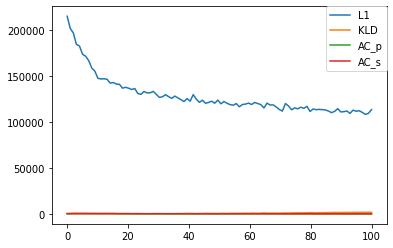

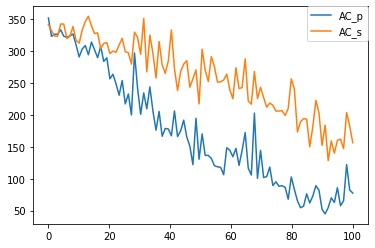

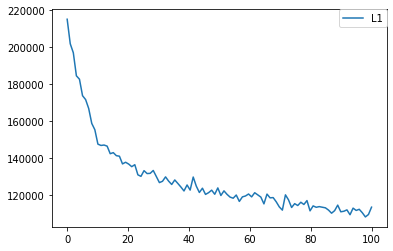

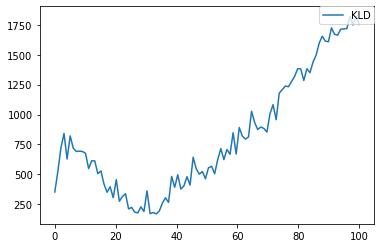

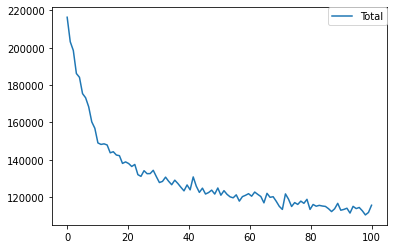

...

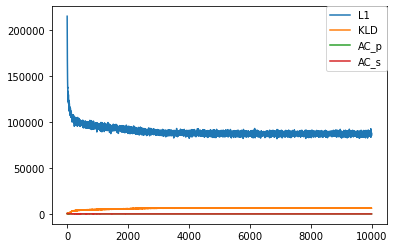

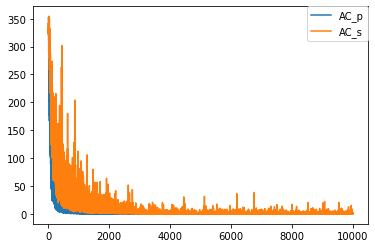

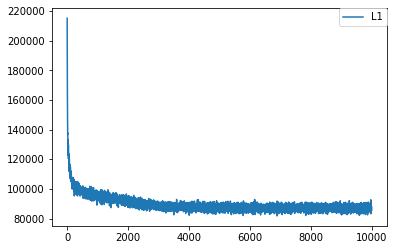

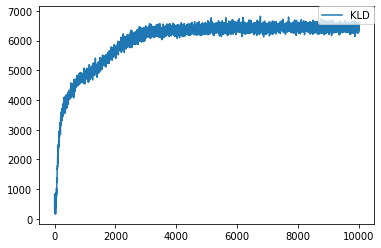

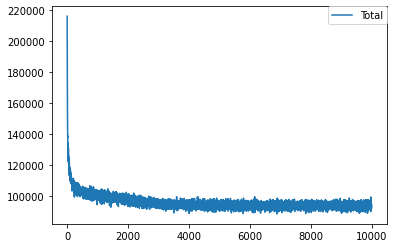

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device)

model = ACVAE(nb_label=nb_label,lambda_p=lambda_p,lambda_s=lambda_s).to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)

model.train()

losses = []
num_epochs=10000
start_time_init = time.time()
for epoch in range(num_epochs):
    epoch += 1
    
    if (epoch == 3000):
        learning_rate = learning_rate_ 
        for param_group in optimizer.param_groups:
            param_group['lr'] = learning_rate
    if (epoch == 6000):
        learning_rate = learning_rate__
        for param_group in optimizer.param_groups:
            param_group['lr'] = learning_rate
    if (epoch == 8000):
        learning_rate = learning_rate___
        for param_group in optimizer.param_groups:
            param_group['lr'] = learning_rate
    
    start_time = time.time()

    print('Epoch: %d' % epoch)

    x_, label_ = data_load_preprocessed(batch_size, 
                            s = -1, 
                            t = -1, 
                            nb_label=4, 
                            data_dir=data_dir, 
                            data_npy_dir=data_npy_dir,
                            voice_dir_list=voice_dir_list, 
                            n_frames=n_frames,
                            sampling_rate=sampling_rate,
                            frame_period=frame_period,
                            num_mcep=num_mcep)
    optimizer.zero_grad()
    loss, loss_list = model.calc_loss(x_, label_)
    loss.backward()
    loss_list.append(sum(loss_list))
    losses.append(loss_list)
    optimizer.step()
    
    if epoch % 1000 == 0:
        test_conv(model, epoch)
    if epoch % 1000 == 0:
        model_save(model, model_dir, model_name)
    if epoch % 2000 == 0:
        model_save(model, model_dir, model_name + "_" + str(epoch))

    if epoch % 100 == 0:
        save_figure(figure_dir, losses, epoch)
    
    elapsed_time = time.time() - start_time
    print('Time Elapsed for one epoch: %02d:%02d:%02d' % (elapsed_time // 3600, (elapsed_time % 3600 // 60), (elapsed_time % 60 // 1)))

model_save(model, model_dir, model_name)
elapsed_time_total = time.time() - start_time_init
print(f'Total elapsed time = %02d:%02d:%02d' % (elapsed_time_total // 3600, (elapsed_time_total % 3600 // 60), (elapsed_time_total % 60 // 1)))

save_figure(final_save_loss_dir, losses, epoch)


In [ ]:
test_conv(model, 10000)

Test
Source File:100110.wav


/content/acvae-vc/preprocess.py:188: RuntimeWarning: divide by zero encountered in log
  f0_converted = np.exp((np.log(f0) - mean_log_src) / std_log_src * std_log_target + mean_log_target)


Converted: SF1 -> SF2
Converted: SF1 -> SM1
Converted: SF1 -> SM2
Source File:100125.wav
Converted: SF2 -> SF1
Converted: SF2 -> SM1
Converted: SF2 -> SM2
Source File:100062.wav
Converted: SM1 -> SF1
Converted: SM1 -> SF2
Converted: SM1 -> SM2
Source File:100027.wav
Converted: SM2 -> SF1
Converted: SM2 -> SF2
Converted: SM2 -> SM1


In [ ]:
if IN_COLAB:
  !git status

On branch main
Your branch is up to date with 'origin/main'.

Untracked files:
  (use "git add <file>..." to include in what will be committed)

	__pycache__/
	output/

nothing added to commit but untracked files present (use "git add" to track)


In [ ]:
if IN_COLAB:
  !git add model
  !git commit -m "Adding model and loss figs"

[main 67c4f04] Changing test.py to make conversion function import possible
 1 file changed, 76 insertions(+), 56 deletions(-)


In [ ]:
if IN_COLAB:
  !git push

Counting objects: 3, done.
Delta compression using up to 2 threads.
Compressing objects: 100% (3/3), done.
Writing objects: 100% (3/3), 833 bytes | 833.00 KiB/s, done.
Total 3 (delta 2), reused 0 (delta 0)
remote: Resolving deltas: 100% (2/2), completed with 2 local objects.
To https://github.com/torresbf/acvae-vc.git
   a194c40..67c4f04  main -> main


In [ ]:
#&test = 'a'
!python test.py --data "/content/acvae-vc/data/vcc2016_training" \
                --file 100058.wav \
                --n_speakers 4 \
                --source 3 \
                --target 1\
                --model-dir "./model/model_2016_60_60_SF1-SF2-SM1-SM2_512/"\
                --model "model_2016_60_60_SF1-SF2-SM1-SM2_512" \
                --output-dir output \
                --sampling-rate 16000 \
                --frame-period 5.0


Conversion Start.
Source File:100058.wav
/content/acvae-vc/preprocess.py:188: RuntimeWarning: divide by zero encountered in log
  f0_converted = np.exp((np.log(f0) - mean_log_src) / std_log_src * std_log_target + mean_log_target)
Converted: SM2 -> SF2


In [ ]:
from test import conv

voice_file = '100058.wav'

print('loading ' + model_name)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device)
model = ACVAE(nb_label=nb_label,lambda_p=0,lambda_s=0).to(device)
model = model_load(model, model_dir, model_name)

conv(model,
     voice_file, 
      data_dir,
      'output',
      3, 
      1,
      sampling_rate,
      voice_dir_list=["SF1", "SF2", "SM1", "SM2"], 
      frame_period=5.0,
     device=device)

loading model_2016_60_60_SF1-SF2-SM1-SM2_512
cuda
Conversion Start.
Source File:100058.wav


/content/acvae-vc/preprocess.py:188: RuntimeWarning: divide by zero encountered in log
  f0_converted = np.exp((np.log(f0) - mean_log_src) / std_log_src * std_log_target + mean_log_target)


Converted: SM2 -> SF2


In [ ]:
import IPython.display as ipd

def play(voice_file, source, target):

  voice_path_s = os.path.join(data_dir, voice_dir_list[source])
  voice_path_s = os.path.join(voice_path_s, voice_file)

  voice_path_t = os.path.join(data_dir, voice_dir_list[target])
  voice_path_t = os.path.join(voice_path_t, voice_file)
  
  print('Original source')
  ipd.display(ipd.Audio(voice_path_s, rate=sampling_rate, autoplay=False))
  print('Original target')
  ipd.display(ipd.Audio(voice_path_t, rate=sampling_rate, autoplay=False))
  print('Converted source-source')
  ipd.display(ipd.Audio('/content/acvae-vc/output/'+voice_dir_list[source]+'_to_'+voice_dir_list[target]+'_['+voice_file+']_nonconv.wav', rate=sampling_rate, autoplay=False))
  print('Converted source-target')
  ipd.display(ipd.Audio('/content/acvae-vc/output/'+voice_dir_list[source]+'_to_'+voice_dir_list[target]+'_['+voice_file+'].wav', rate=sampling_rate, autoplay=False))


In [ ]:
voice_file = '100065.wav'
sr = 0
tg = 3
model = ACVAE(nb_label=nb_label,lambda_p=0,lambda_s=0).to(device)
model = model_load(model, model_dir, model_name)

conv(model,
     voice_file, 
      data_dir,
      'output',
      sr, 
      tg,
      sampling_rate,
      voice_dir_list=["SF1", "SF2", "SM1", "SM2"], 
      frame_period=5.0,
     device=device)
play(voice_file, sr, tg)

Conversion Start.
Source File:100065.wav
Converted: SF1 -> SM2
Original source


/content/acvae-vc/preprocess.py:188: RuntimeWarning: divide by zero encountered in log
  f0_converted = np.exp((np.log(f0) - mean_log_src) / std_log_src * std_log_target + mean_log_target)


Original target


Converted source-source


Converted source-target
